
#Pre-processing

In [ ]:
from google.colab import files
uploaded = files.upload()
## Upload the data csv here

Saving raw_total_fight_data.csv to raw_total_fight_data (1).csv
Saving data.csv to data (1).csv
Saving preprocessed_data.csv to preprocessed_data (1).csv
Saving raw_fighter_details.csv to raw_fighter_details (1).csv


In [ ]:
## Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import seaborn
from imblearn.over_sampling import SMOTE
import scipy.stats as stats
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import VarianceThreshold
from sklearn.decomposition import PCA
from sklearn.linear_model import RidgeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score
import pickle
from sklearn.metrics import ConfusionMatrixDisplay
#from tqdm import tqdm
%matplotlib inline

Number of columns with nans: 108
Total Number of columns: 137
Number of rows with nans: 1767
Total Number of rolumns: 5902


<ipython-input-10-600e123325ca>:36: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X_encoded = allFeaturesEncoded.replace({True: 1, False: 0})
<ipython-input-10-600e123325ca>:68: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  correlation, pVal = stats.pearsonr(tempX.iloc[:,i2].values, np.squeeze(targetVar.replace(['Red','Blue'],[1,0]).values))


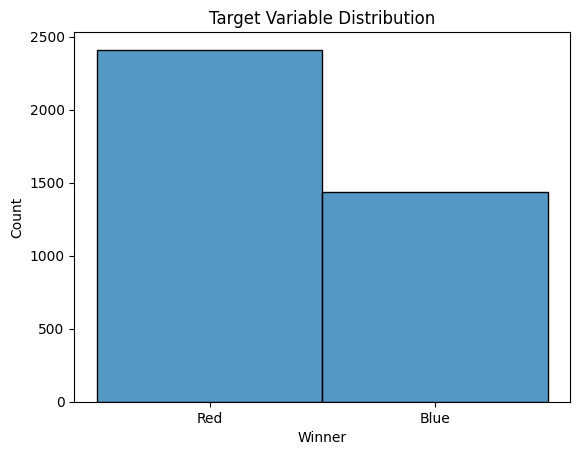

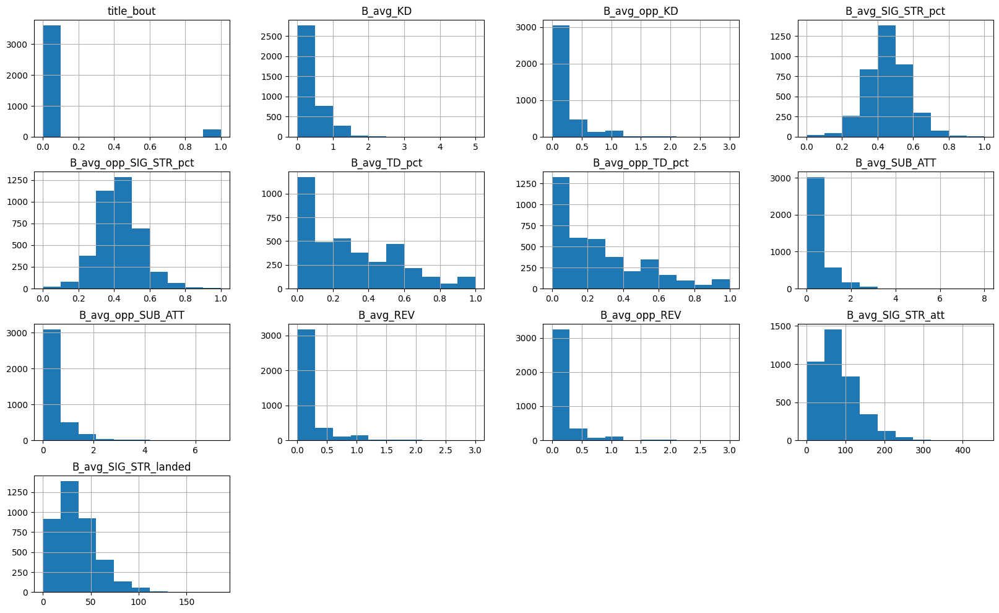

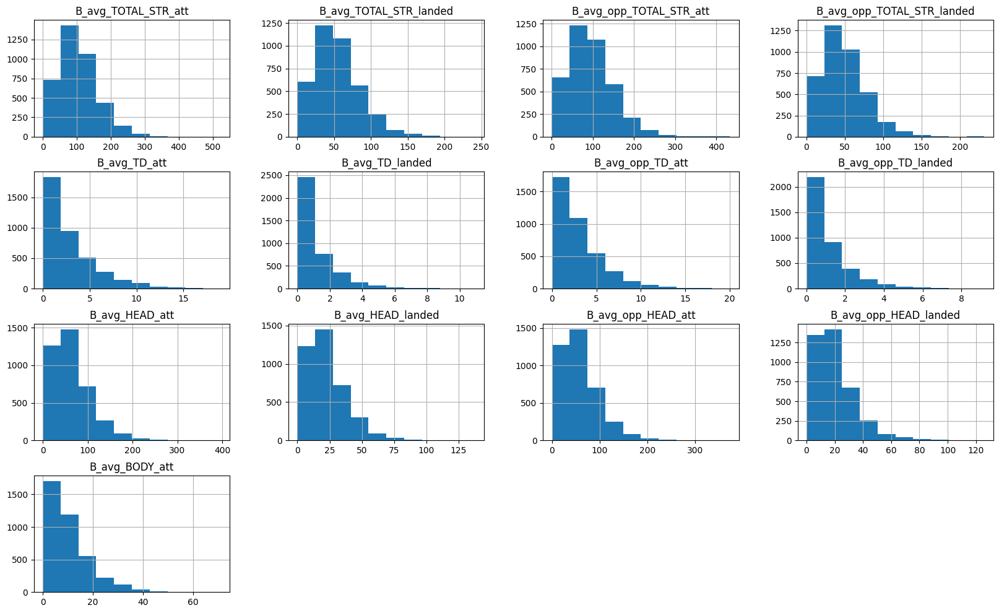

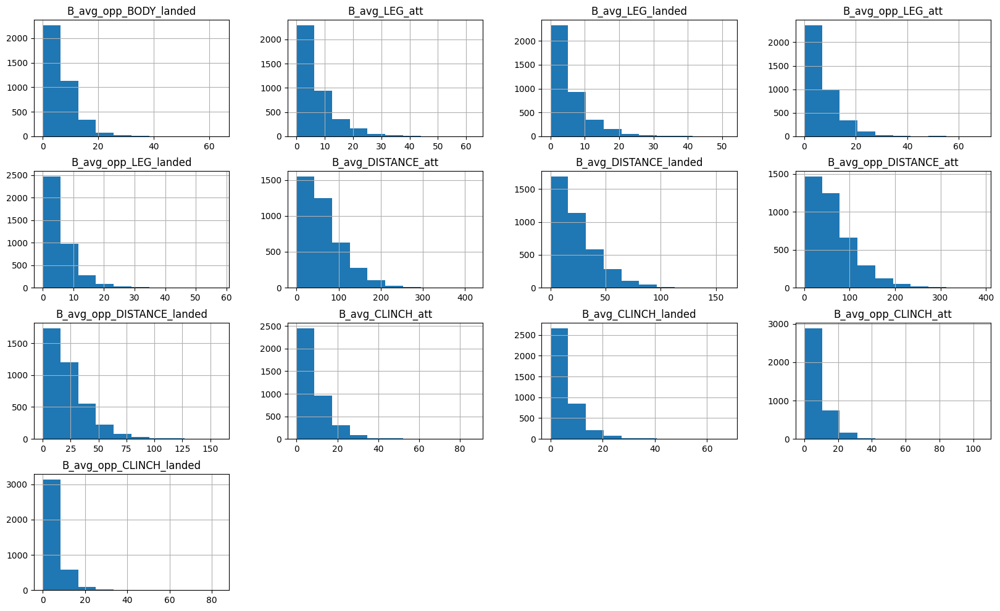

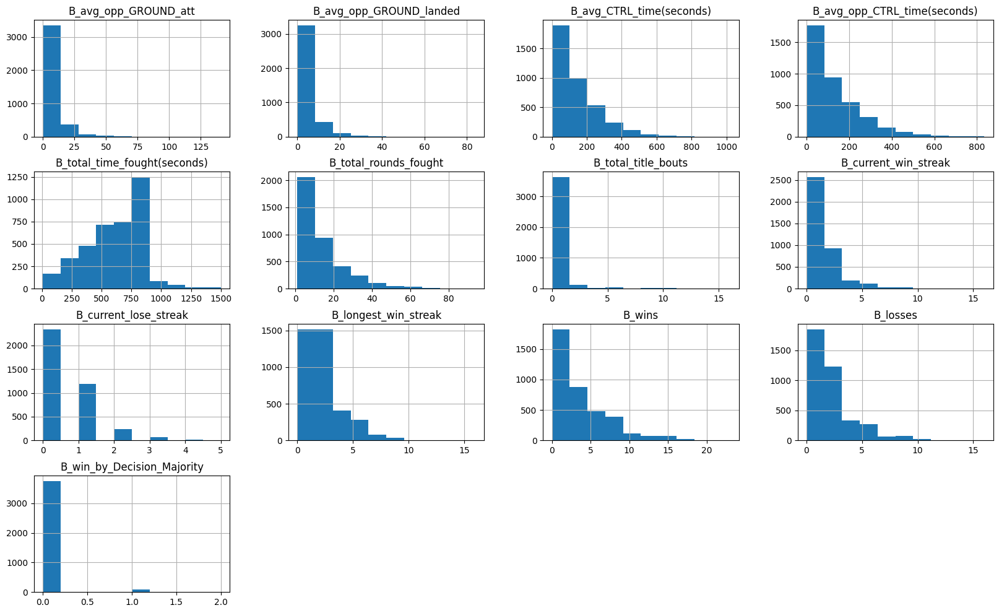

...

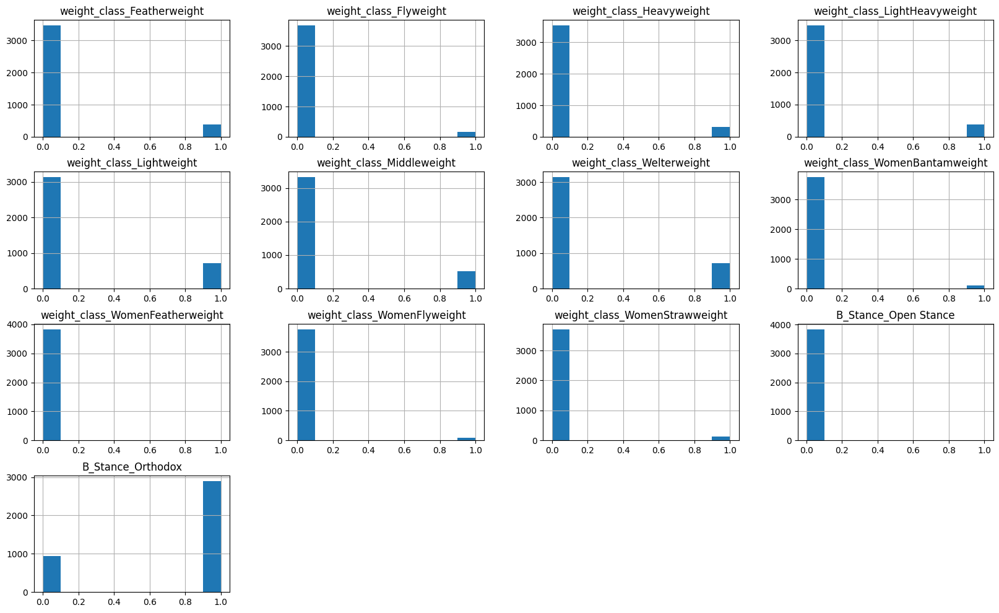

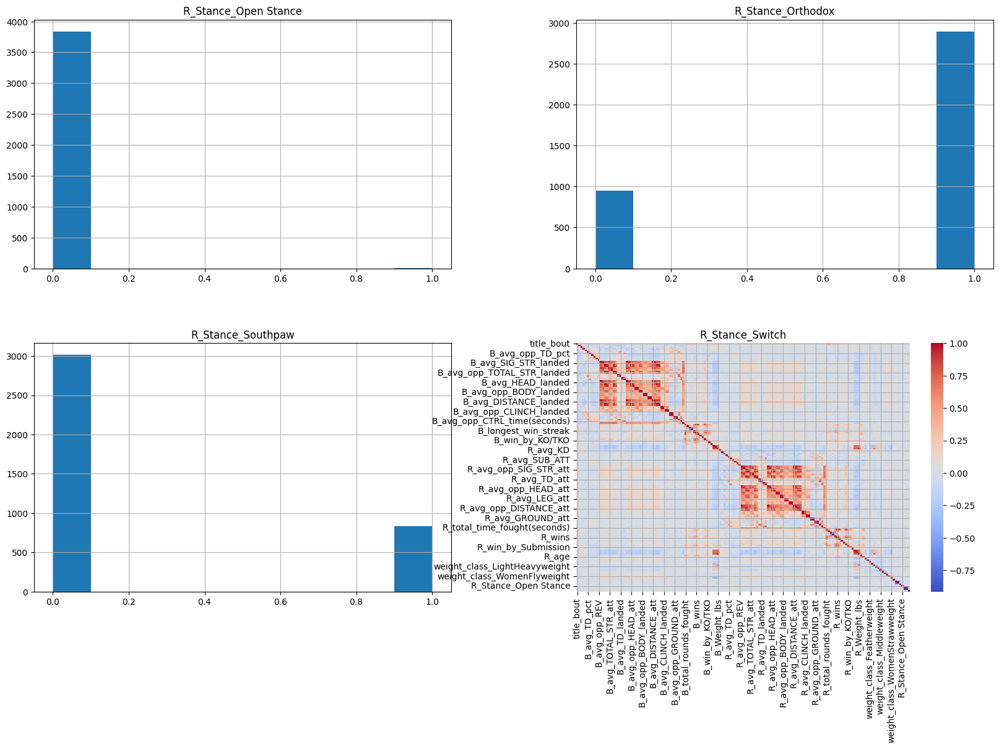

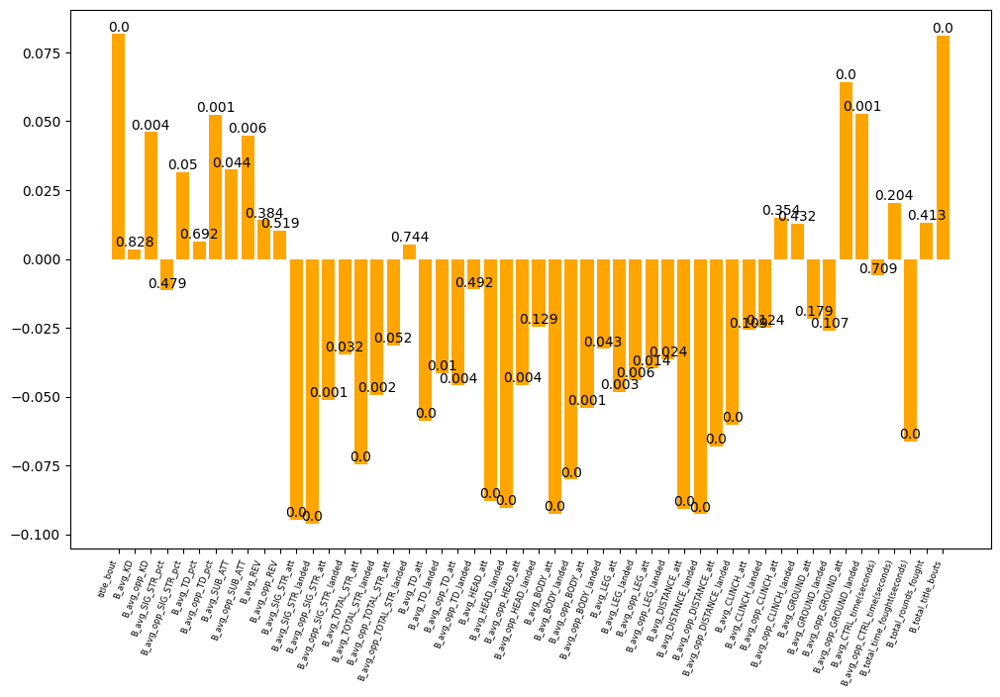

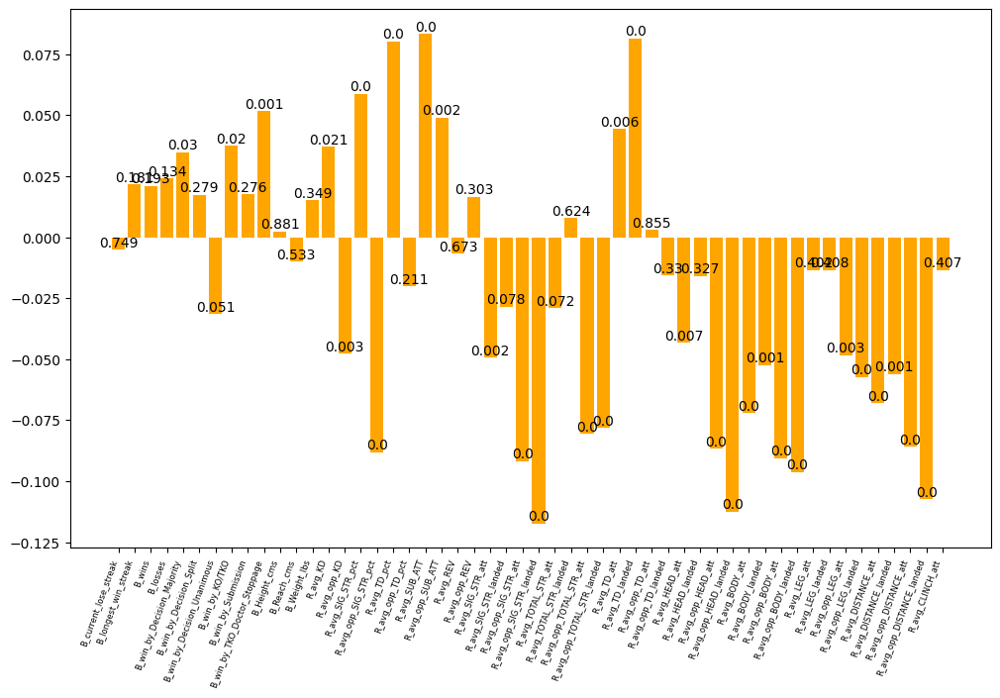

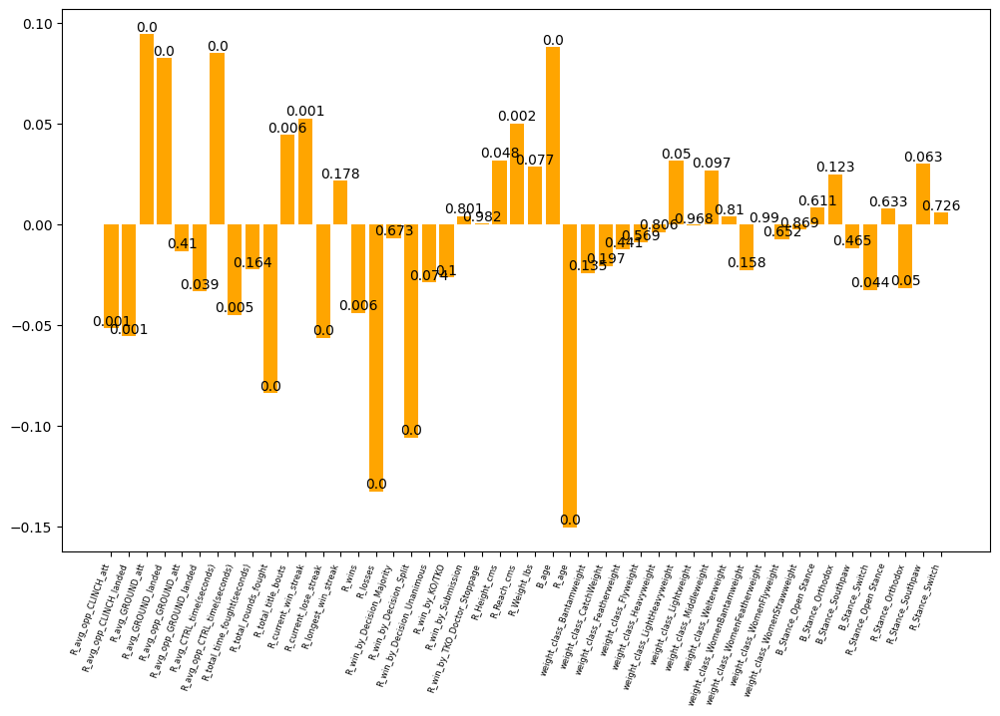

In [ ]:
## Load in data, replace with your path to csv
fightTable = pd.read_csv("/content/data.csv")

## Dropping unused columns
colsToDrop = ['R_fighter','B_fighter','date','location','Referee','R_draw','B_draw']
fightTable.drop(colsToDrop,axis=1, inplace=True)

## Remove all samples that ended in draw
fightTable = fightTable[fightTable['Winner']!='Draw']
### Explore Nans

colNans = fightTable.isna().sum(axis=0)
rowNans = fightTable.isna().sum(axis=1)

print('Number of columns with nans: ' + str(len(colNans[colNans>1])))
print('Total Number of columns: ' + str(np.shape(fightTable)[1]))

print('Number of rows with nans: ' + str(len(rowNans[rowNans>1])))
print('Total Number of rolumns: ' + str(np.shape(fightTable)[0]))


## It was decided to remove rows with NaNs instead of columns, since we preserve far more features this way
## while still keeping a good number of samples
fightTableCleaned = fightTable.dropna(axis=0)

targetVar = pd.DataFrame(fightTableCleaned['Winner'])
allFeatures = fightTableCleaned.drop('Winner',axis=1)

## One Hot Encode all categorical features
allFeaturesEncoded = pd.get_dummies(allFeatures)

## Check Target Variable distribution
seaborn.histplot(targetVar,x='Winner')
plt.title('Target Variable Distribution')
## Replace true/false with 1/0
X_encoded = allFeaturesEncoded.replace({True: 1, False: 0})


## Plot distributions of features

figIter = 1

for i in np.arange(0,156,15):

    X_encoded.iloc[:,i:i+13].hist(figsize=(20,12))


    #plt.savefig(saveDir + 'featureDist_' + str(figIter))
    #plt.close()
    figIter = figIter + 1

## Plot Correlations of features
corrMat = X_encoded.corr()
seaborn.heatmap(corrMat, annot=False, cmap='coolwarm')


## Plot Feature Correlations with target

figIter = 1

for i in np.arange(0,156,53):

    tempX = X_encoded.iloc[:,i:i+52]
    allCorrs = []
    allPs = []

    for i2 in np.arange(0,np.shape(tempX)[1]):
        correlation, pVal = stats.pearsonr(tempX.iloc[:,i2].values, np.squeeze(targetVar.replace(['Red','Blue'],[1,0]).values))
        allCorrs.append(correlation)
        allPs.append(pVal)

    plt.figure(figsize=(12,8))
    bars = plt.bar(tempX.columns.values, allCorrs, color='orange')
    plt.xticks(fontsize=6)
    plt.subplots_adjust(bottom=0.2)
    # Annotating bars
    pIter = 0
    for bar in bars:

        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(),
                 str(np.around(allPs[pIter],3)), ha='center', va='bottom', fontsize=10)
        plt.xticks(rotation=70, ha='right')
        pIter = pIter + 1

    #plt.savefig(saveDir + 'featureTargetCorr_' + str(figIter))
    #plt.close()
    figIter = figIter + 1


#Michael's Section, PCA

  ModelType  PCAKept  Accuracy
0     Ridge        1  0.563938
1     Ridge        2  0.563935
8       SVC        4  0.541542
3     Ridge        4  0.538414
5       SVC        1  0.537117
7       SVC        3  0.534495
6       SVC        2  0.533205
2     Ridge        3  0.527213
4     Ridge        5  0.526968
9       SVC        5  0.523335


Text(0.5, 1.0, 'SVC, 4 PC kept')

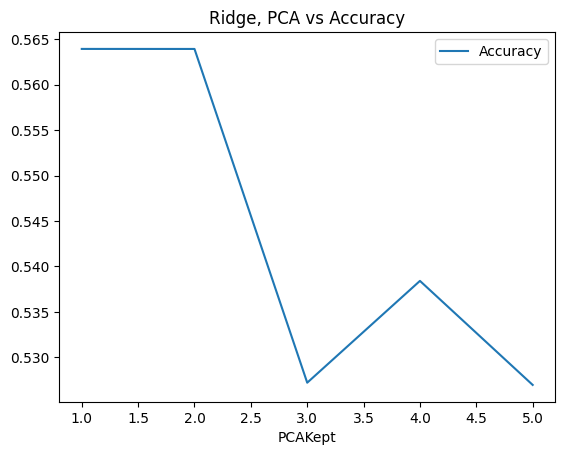

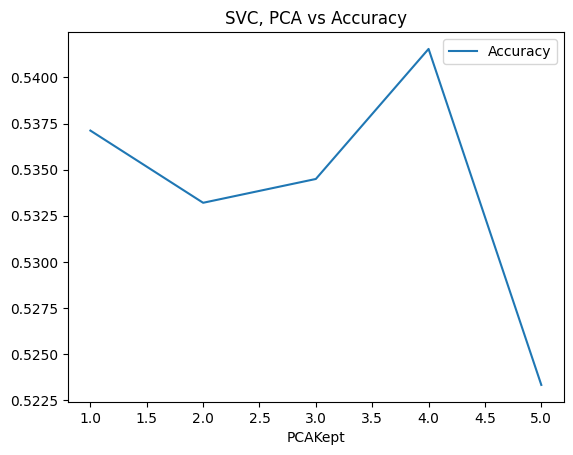

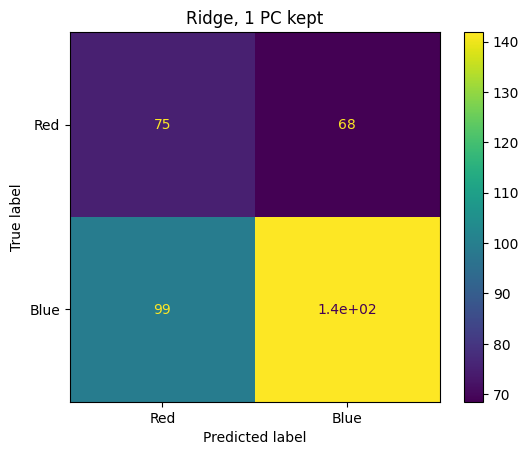

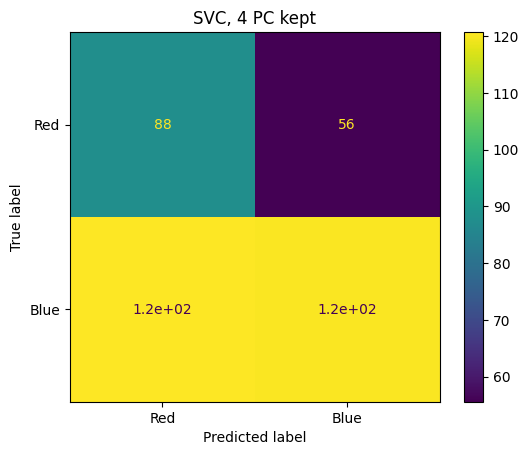

In [ ]:

## Split into 10 folds for cross validation
kf = KFold(n_splits=10)

accScores = []
pcaKept = []
confusionMatrices = []
f1ScoresRed = []
f1ScoresBlue = []
modelType = []
splitNumber = []

splitIter = 1
for train_index, test_index in kf.split(X_encoded):

    X_train, X_test = X_encoded.iloc[train_index], X_encoded.iloc[test_index]
    y_train, y_test = targetVar.iloc[train_index], targetVar.iloc[test_index]

    ## Perform smote on train fold to balance classes, only on train to avoid leakage
    smote = SMOTE(random_state=42)
    X_train, y_train = smote.fit_resample(X_train,y_train)

    ## Use Standard Scaling on train and fit on test set
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    ## Use VarianceThreshold to remove features with low variance, fit on train and transform test
    sel = VarianceThreshold(threshold=(.8 * (1 - .8)))
    X_train = sel.fit_transform(X_train)
    selFeatures = sel.get_feature_names_out()

    X_test = sel.transform(X_test)
    for i in np.arange(1,6):
        pca = PCA(n_components = i)

        X_train_pca = pca.fit_transform(X_train)
        X_test_pca = pca.transform(X_test)

        ## Ridge classifier
        paramGrid = {'alpha':[0.01, 0.1, .5, 1, 3, 5, 10]}

        ridge = RidgeClassifier(random_state = 1)

        ridgeGrid = GridSearchCV(ridge,paramGrid,scoring='accuracy')
        ridgeGrid.fit(X_train_pca,np.squeeze(y_train))

        currPredicts = ridgeGrid.predict(X_test_pca)
        currAcc = accuracy_score(y_test,currPredicts)
        currCMat = confusion_matrix(y_test,currPredicts)
        currF1Red = f1_score(y_test,currPredicts,pos_label='Red')
        currF1Blue = f1_score(y_test,currPredicts,pos_label='Blue')

        accScores.append(currAcc)
        pcaKept.append(i)
        confusionMatrices.append(currCMat)
        f1ScoresRed.append(currF1Red)
        f1ScoresBlue.append(currF1Blue)
        modelType.append('Ridge')
        splitNumber.append(splitIter)

        ## SVC
        svc = SVC(random_state=1,kernel='rbf')
        paramGrid = {'C':[.01, .1, .5, 1, 5, 10],'degree':[2, 3, 4]}
        svcGrid = GridSearchCV(svc,paramGrid,scoring='accuracy')
        svcGrid.fit(X_train_pca,np.squeeze(y_train))

        currPredicts = svcGrid.predict(X_test_pca)
        currAcc = accuracy_score(y_test, currPredicts)
        currCMat = confusion_matrix(y_test, currPredicts)
        currF1Red = f1_score(y_test, currPredicts, pos_label='Red')
        currF1Blue = f1_score(y_test, currPredicts, pos_label='Blue')

        accScores.append(currAcc)
        pcaKept.append(i)
        confusionMatrices.append(currCMat)
        f1ScoresRed.append(currF1Red)
        f1ScoresBlue.append(currF1Blue)
        modelType.append('SVC')
        splitNumber.append(splitIter)

    #print(splitIter)
    splitIter = splitIter + 1

resultsDict = {'ModelType':modelType, 'PCAKept':pcaKept, 'Split':splitNumber, 'Accuracy':accScores, 'ConfusionMatrix':confusionMatrices,
               'F1Red':f1ScoresRed, 'F1Blue':f1ScoresBlue}
resultsDf = pd.DataFrame(resultsDict)

allModels = np.unique(resultsDf['ModelType'])
allPca = np.unique(resultsDf['PCAKept'])

modelNames = []
pcaNums = []
accAvg = []
cmatAvg = []
f1RedAvg = []
f1BlueAvg = []
for currModel in allModels:
    for currPca in allPca:
        currDf = resultsDf[resultsDf['ModelType'] == currModel]
        currDf = currDf[currDf['PCAKept'] == currPca]

        currAcc = np.mean(currDf['Accuracy'])
        currCMat = np.mean(currDf['ConfusionMatrix'])
        currF1Red = np.mean(currDf['F1Red'])
        currF1Blue = np.mean(currDf['F1Blue'])

        modelNames.append(currModel)
        pcaNums.append(currPca)
        accAvg.append(currAcc)
        cmatAvg.append(currCMat)
        f1RedAvg.append(currF1Red)
        f1BlueAvg.append(currF1Blue)


avgDict = {'ModelType':modelNames, 'PCAKept':pcaNums, 'Accuracy':accAvg, 'ConfusionMatrix':cmatAvg,
               'F1Red':f1RedAvg, 'F1Blue':f1BlueAvg}
avgDf = pd.DataFrame(avgDict)

avgDf = avgDf.sort_values('Accuracy',ascending=False)
print(avgDf[['ModelType','PCAKept','Accuracy']])

ridgeDf = avgDf[avgDf['ModelType'] == 'Ridge']
svcDf = avgDf[avgDf['ModelType'] == 'SVC']

## Plot accuracy against pcaKept
ridgeDf.sort_values('PCAKept').plot(x='PCAKept', y='Accuracy', kind='line')
plt.title('Ridge, PCA vs Accuracy')
svcDf.sort_values('PCAKept').plot(x='PCAKept', y='Accuracy', kind='line')
plt.title('SVC, PCA vs Accuracy')

##Plot confusion matrix for best SVC model and best Ridge model
#Ridge
currMat = avgDf.iloc[0,3]
blah = ConfusionMatrixDisplay(currMat,display_labels=['Red','Blue'])
blah.plot()
plt.title('Ridge, 1 PC kept')

#SVC
currMat = avgDf.iloc[2,3]
blah = ConfusionMatrixDisplay(currMat,display_labels=['Red','Blue'])
blah.plot()
plt.title('SVC, 4 PC kept')


#Sabdha's Section

Approximate run time : 2 hours

In [ ]:
#Code

Mounted at /content/drive
Columns with NaN values: ['Referee', 'B_avg_KD', 'B_avg_opp_KD', 'B_avg_SIG_STR_pct', 'B_avg_opp_SIG_STR_pct', 'B_avg_TD_pct', 'B_avg_opp_TD_pct', 'B_avg_SUB_ATT', 'B_avg_opp_SUB_ATT', 'B_avg_REV', 'B_avg_opp_REV', 'B_avg_SIG_STR_att', 'B_avg_SIG_STR_landed', 'B_avg_opp_SIG_STR_att', 'B_avg_opp_SIG_STR_landed', 'B_avg_TOTAL_STR_att', 'B_avg_TOTAL_STR_landed', 'B_avg_opp_TOTAL_STR_att', 'B_avg_opp_TOTAL_STR_landed', 'B_avg_TD_att', 'B_avg_TD_landed', 'B_avg_opp_TD_att', 'B_avg_opp_TD_landed', 'B_avg_HEAD_att', 'B_avg_HEAD_landed', 'B_avg_opp_HEAD_att', 'B_avg_opp_HEAD_landed', 'B_avg_BODY_att', 'B_avg_BODY_landed', 'B_avg_opp_BODY_att', 'B_avg_opp_BODY_landed', 'B_avg_LEG_att', 'B_avg_LEG_landed', 'B_avg_opp_LEG_att', 'B_avg_opp_LEG_landed', 'B_avg_DISTANCE_att', 'B_avg_DISTANCE_landed', 'B_avg_opp_DISTANCE_att', 'B_avg_opp_DISTANCE_landed', 'B_avg_CLINCH_att', 'B_avg_CLINCH_landed', 'B_avg_opp_CLINCH_att', 'B_avg_opp_CLINCH_landed', 'B_avg_GROUND_att', 'B_avg_

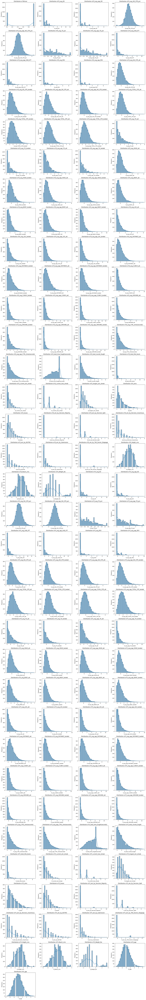

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


from google.colab import drive
drive.mount('/content/drive')

# Replace with the actual path to your dataset
dataset_path = '/content/drive/MyDrive/Colab Notebooks/ML_project/data.csv'

df = pd.read_csv(dataset_path)


nan_columns = df.columns[df.isnull().any()]
print("Columns with NaN values:", nan_columns.tolist())


df.info()
df.describe()


df=df.drop('B_draw',axis=1)
df=df.drop('R_draw',axis=1)

df=df[df['Winner']!='Draw']
df_2=df.copy()


df = df.dropna()


df['Winner'] = df['Winner'].apply(lambda x: 1 if x == 'Red' else 0)
# df.head()
# Check the datatype of the 'Winner' column
# print(df['Winner'].dtype)
df=df.drop('date',axis=1)



from sklearn.preprocessing import StandardScaler
# Identify numerical columns
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
numerical_cols = [col for col in numerical_cols if col != 'Winner']

# Apply standard scaling to numerical columns only
scaler = StandardScaler()
df[numerical_cols] = scaler.fit_transform(df[numerical_cols])

print("DataFrame after Standard Scaling on Numerical Columns:")
df


# Identify categorical columns (type 'object' or 'category')
categorical_cols = df.select_dtypes(include=['object', 'category']).columns
print(categorical_cols )
# # Apply one-hot encoding to categorical columns
df_encoded = pd.get_dummies(df, columns=categorical_cols)



dfe=df_encoded.copy()
dfe.head()




# Histogram for normalized values
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Set the number of columns per row for the grid
num_cols = 4
num_plots = len(numerical_columns)
num_rows = (num_plots + num_cols - 1) // num_cols  # Calculate the required rows

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 4 * num_rows))
axes = axes.flatten()  # Flatten the axes for easy iteration

for i, col in enumerate(numerical_columns):
    sns.histplot(data=df, x=col, bins=30, kde=True, ax=axes[i])  # Add KDE for smooth distribution
    axes[i].set_title(f"Distribution of {col}")
    axes[i].set_xlabel(col)
    axes[i].set_ylabel("Frequency")

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()




In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3821 entries, 0 to 5884
Columns: 141 entries, R_fighter to R_age
dtypes: bool(1), float64(132), int64(1), object(7)
memory usage: 4.1+ MB


<ipython-input-16-6a6637479f0a>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


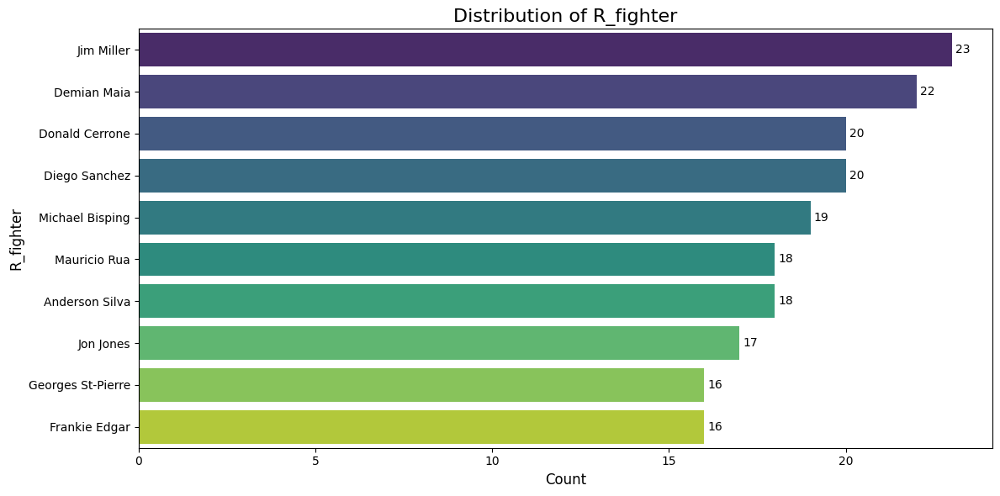

<ipython-input-16-6a6637479f0a>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


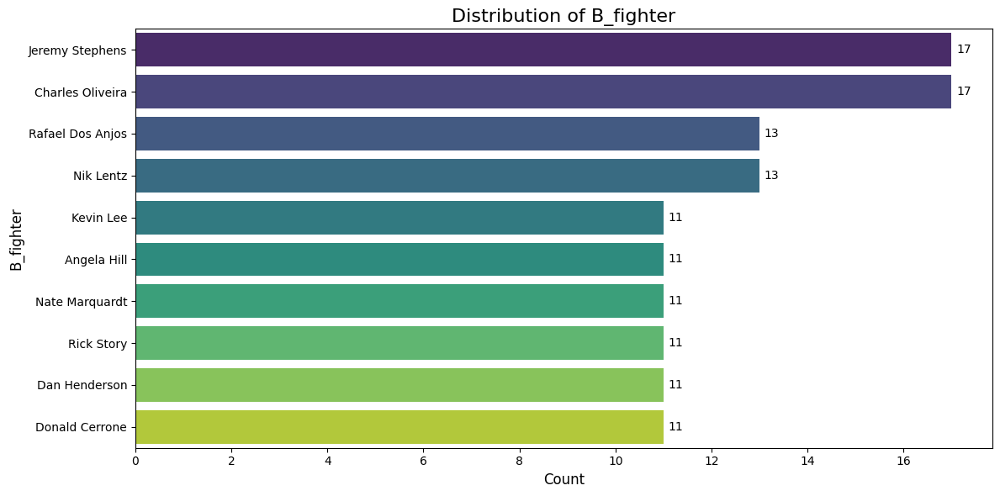

<ipython-input-16-6a6637479f0a>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


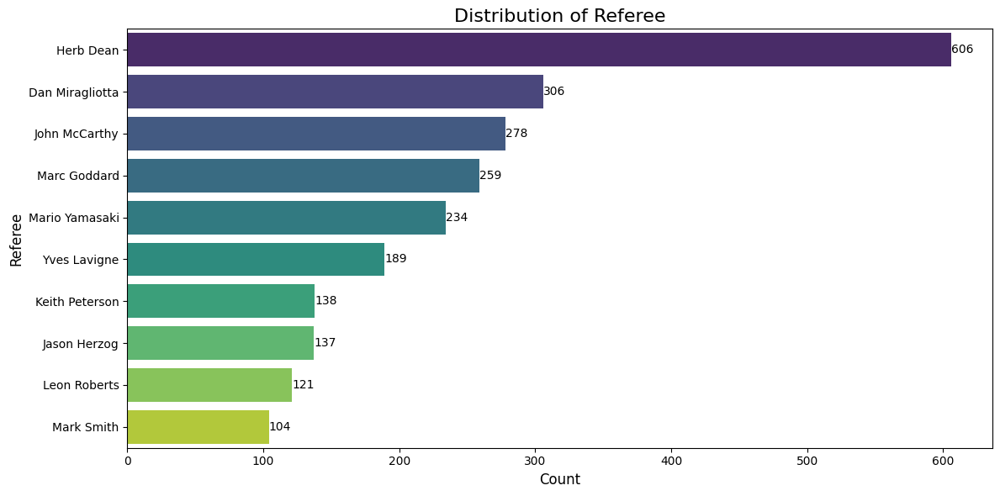

<ipython-input-16-6a6637479f0a>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


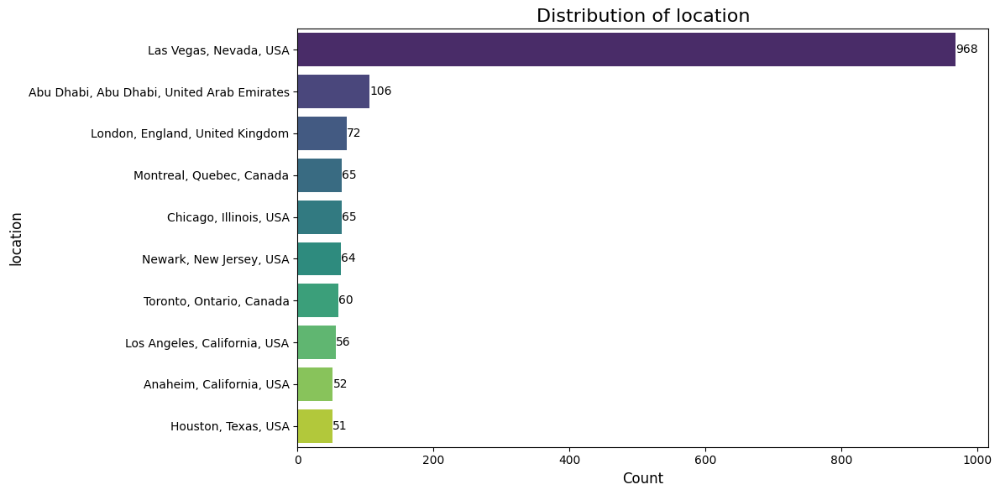

<ipython-input-16-6a6637479f0a>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


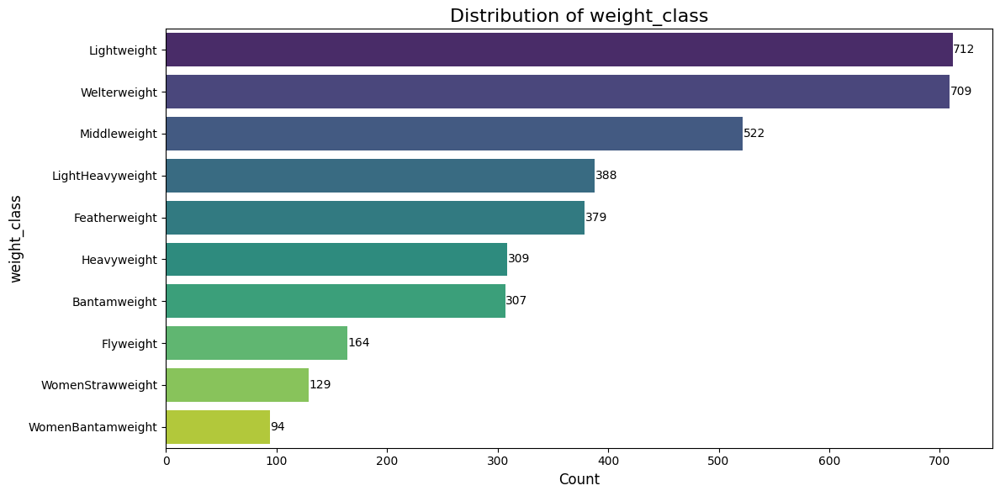

<ipython-input-16-6a6637479f0a>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


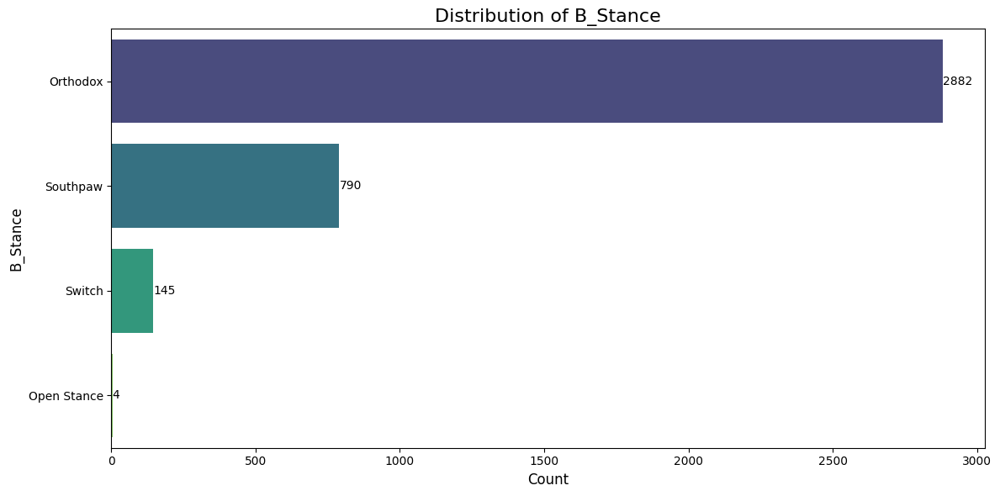

<ipython-input-16-6a6637479f0a>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


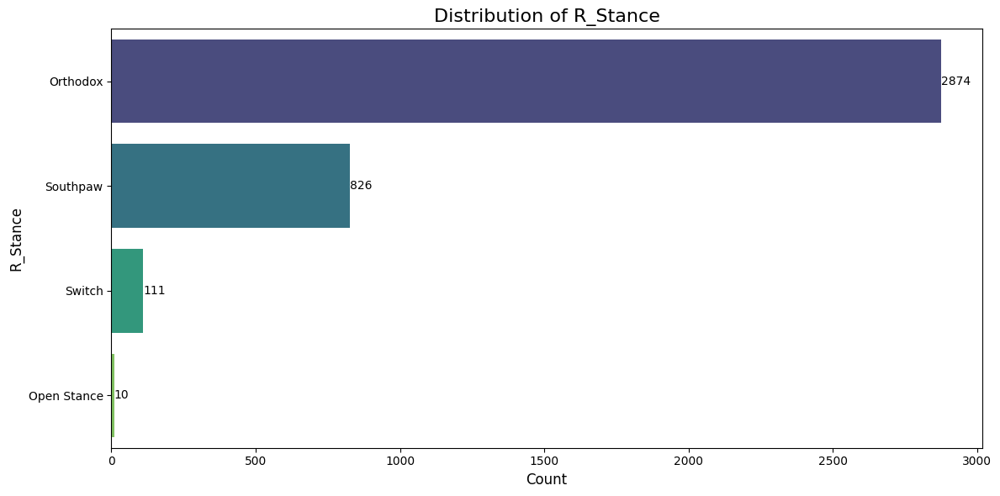

In [ ]:
# Bar plots for categorical columns
categorical_columns = df.select_dtypes(include=['object']).columns
for col in categorical_columns:
    plt.figure(figsize=(12, 6))  # Wider plot for better visibility

    # Get top 10 most frequent categories for each column
    top_categories = df[col].value_counts().head(10)

    sns.barplot(
        x=top_categories.values,
        y=top_categories.index,  # Horizontal bars
        palette='viridis'
    )

    # Add annotations to show the counts
    for index, value in enumerate(top_categories.values):
        plt.text(value + 0.1, index, str(value), va='center', fontsize=10)

    # Title and labels
    plt.title(f'Distribution of {col}', fontsize=16)
    plt.xlabel('Count', fontsize=12)
    plt.ylabel(col, fontsize=12)
    plt.tight_layout()
    plt.show()

<ipython-input-17-892e28936b10>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df_2['Winner'], palette='Set2')


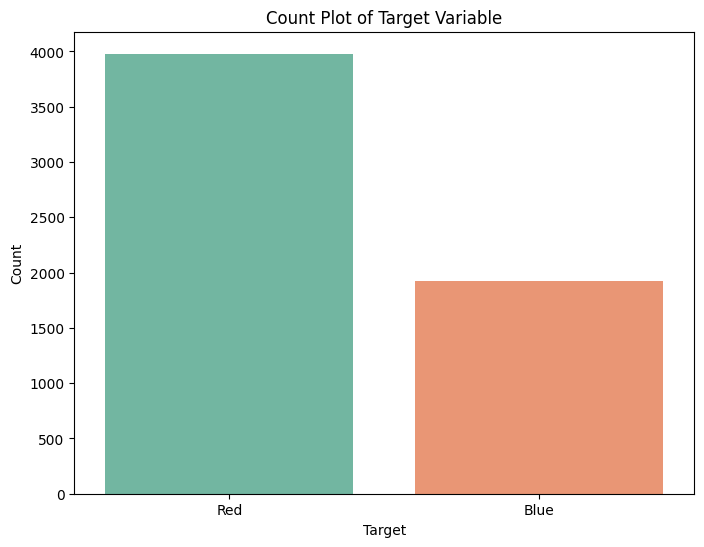

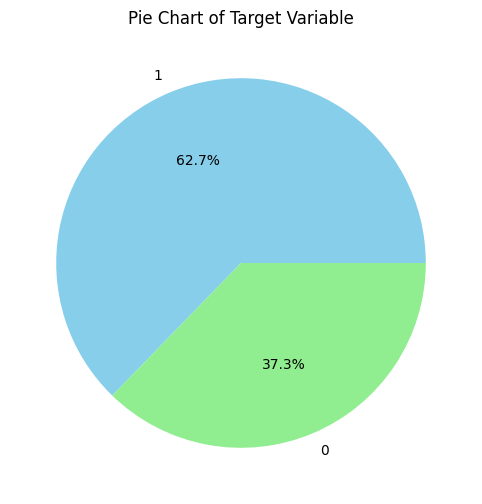

In [ ]:

# 1. Count Plot
plt.figure(figsize=(8, 6))
sns.countplot(x=df_2['Winner'], palette='Set2')
plt.title('Count Plot of Target Variable')
plt.xlabel('Target')
plt.ylabel('Count')
plt.show()

# 2. Pie Chart
plt.figure(figsize=(8, 6))
df['Winner'].value_counts().plot.pie(autopct='%1.1f%%', colors=['skyblue', 'lightgreen'])
plt.title('Pie Chart of Target Variable')
plt.ylabel('')  # Remove default ylabel
plt.show()

In [ ]:
df=dfe.copy()



In [ ]:
# Compute correlation matrix

# Select only the numeric columns from the DataFrame
numeric_df = df.select_dtypes(include=['number'])

# Compute correlation matrix
correlation_matrix = numeric_df.corr()
# correlation_matrix = df_scaled.corr()

# Initialize lists to store results
high_corr_pairs = []  # Correlation > 0.8
low_corr_pairs = []   # 0.0 < Correlation <= 0.2

# Loop through correlation matrix
for i in range(len(correlation_matrix.columns)):
    for j in range(i + 1, len(correlation_matrix.columns)):  # Avoid duplicate pairs
        feature1 = correlation_matrix.columns[i]
        feature2 = correlation_matrix.columns[j]
        corr_value = correlation_matrix.iloc[i, j]

        # Check for high correlation
        if corr_value > 0.8:
            high_corr_pairs.append((feature1, feature2, corr_value))
        # Check for low correlation
        elif 0.0 < corr_value <= 0.2:
            low_corr_pairs.append((feature1, feature2, corr_value))

In [ ]:
# Convert results to DataFrame for easier viewing
high_corr_df = pd.DataFrame(high_corr_pairs, columns=['Feature1', 'Feature2', 'Correlation'])
low_corr_df = pd.DataFrame(low_corr_pairs, columns=['Feature1', 'Feature2', 'Correlation'])

# Display results
print("Highly Correlated Features (Correlation > 0.8):")
print(high_corr_df)

Highly Correlated Features (Correlation > 0.8):
                  Feature1                 Feature2  Correlation
0        B_avg_SIG_STR_att     B_avg_SIG_STR_landed     0.921227
1        B_avg_SIG_STR_att    B_avg_opp_SIG_STR_att     0.819866
2        B_avg_SIG_STR_att      B_avg_TOTAL_STR_att     0.924055
3        B_avg_SIG_STR_att           B_avg_HEAD_att     0.977758
4        B_avg_SIG_STR_att        B_avg_HEAD_landed     0.863038
..                     ...                      ...          ...
128   R_avg_opp_GROUND_att  R_avg_opp_GROUND_landed     0.967552
129  R_total_rounds_fought                   R_wins     0.921449
130  R_total_rounds_fought                 R_losses     0.814854
131           R_Height_cms              R_Reach_cms     0.898223
132           R_Height_cms             R_Weight_lbs     0.806154

[133 rows x 3 columns]


In [ ]:
# print("\nLow Correlation Features (0.0 < Correlation <= 0.2):")
# low_corr_df

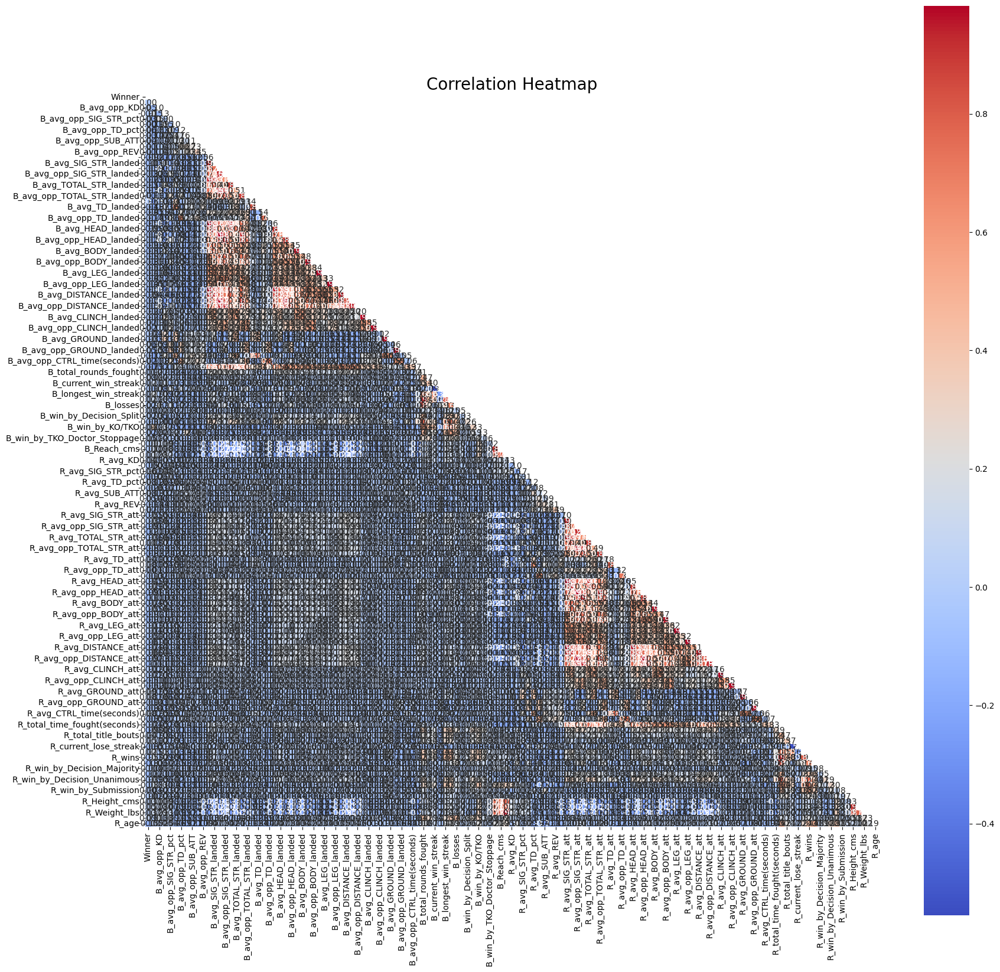

In [ ]:
# Compute correlation matrix
correlation_matrix = numeric_df.corr()

# correlation_matrix = df_scaled.corr()

# Plot heatmap
plt.figure(figsize=(20, 20))  # Adjust the figure size as needed
sns.heatmap(
    correlation_matrix,
    annot=True,  # Show correlation values
    fmt=".2f",  # Format decimal places
    cmap="coolwarm",  # Color map
    square=True,
    cbar=True,
    mask=np.triu(correlation_matrix)  # Show only the lower triangle
)
plt.title("Correlation Heatmap", fontsize=20)
plt.show()

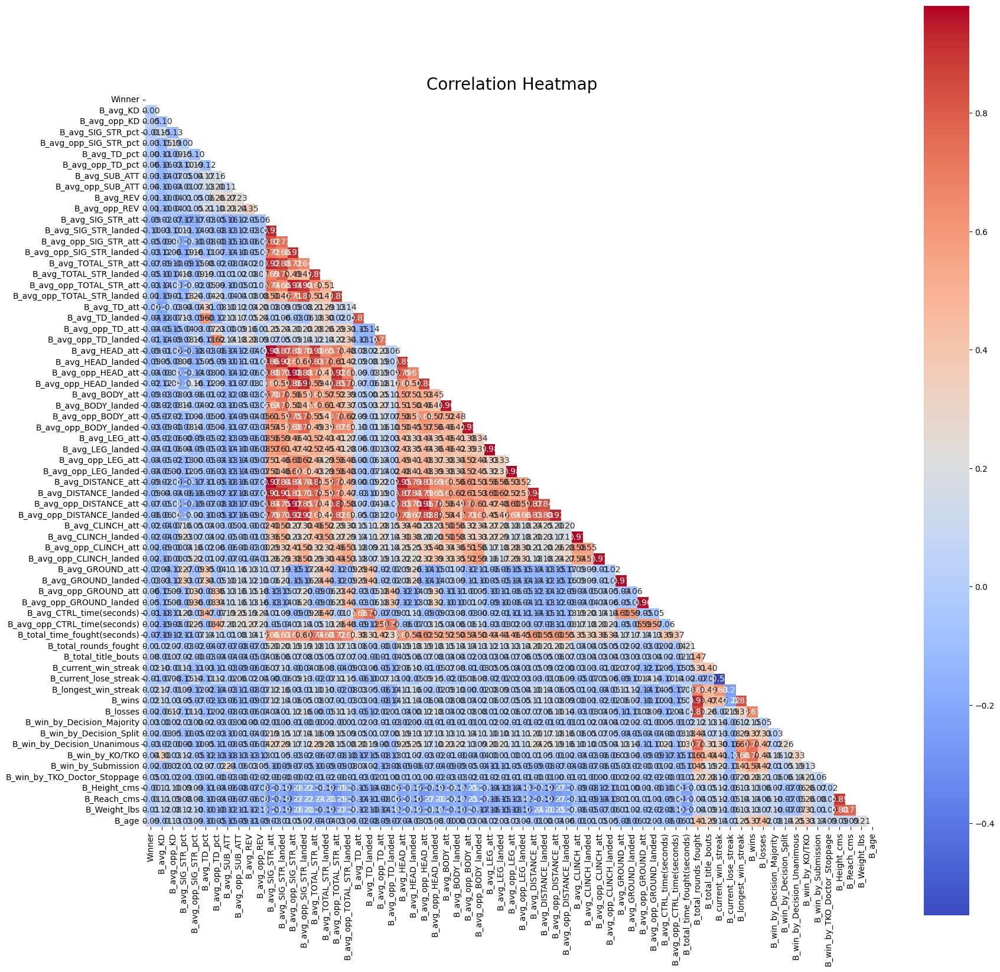

In [ ]:
# Initialize an empty list to store column names
r_columns = ['Winner']
b_columns = ['Winner']
# Loop through all column names in the DataFrame
for col in df.columns:
    # Check if the column name starts with 'R_'
    if col.startswith('R_'):
        r_columns.append(col)
    elif col.startswith('B_'):
        b_columns.append(col)

# Print the list of columns
# r_columns
# b_columns

df_r=df[r_columns].copy()
df_b=df[b_columns].copy()



# correlation_matrix = numeric_df.corr()
numeric_df_b = df_b.select_dtypes(include=['number'])

correlation_matrix_b = numeric_df_b.corr()
# Plot heatmap
plt.figure(figsize=(20, 20))  # Adjust the figure size as needed
sns.heatmap(
    correlation_matrix_b,
    annot=True,  # Show correlation values
    fmt=".2f",  # Format decimal places
    cmap="coolwarm",  # Color map
    square=True,
    cbar=True,
    mask=np.triu(correlation_matrix_b)  # Show only the lower triangle
)
plt.title("Correlation Heatmap", fontsize=20)
plt.show()

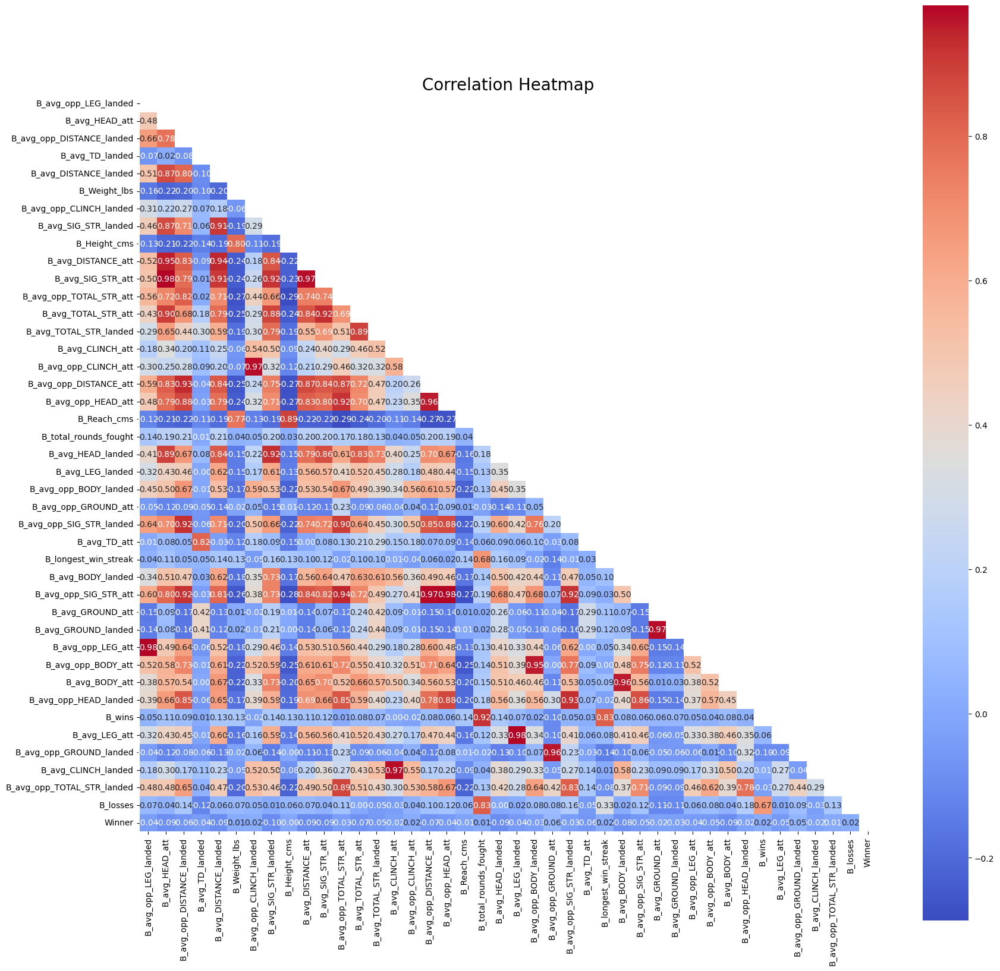

In [ ]:
# Set a threshold for high correlation
threshold = 0.8

# Find the indices where correlation is above the threshold
high_corr_pairs = correlation_matrix_b[(correlation_matrix_b > threshold) & (correlation_matrix_b < 1.0)].stack().reset_index()
high_corr_pairs.columns = ['Feature 1', 'Feature 2', 'Correlation']

# Display the high correlations
# print("Highly correlated features (correlation > 0.8):")
# high_corr_pairs



# Assuming you have the DataFrame with correlations named `correlation_df`
# Extract unique feature names from both "Feature 1" and "Feature 2"
unique_features = set(high_corr_pairs['Feature 1']).union(set(high_corr_pairs['Feature 2']))

# Convert the set to a list (if needed)
unique_feature_list = list(unique_features)

len(unique_feature_list)

df_b_target=df_b[unique_feature_list].copy()
df_b_target['Winner']=df_b['Winner']



# Compute the correlation matrix
numeric_df_b = df_b_target.select_dtypes(include=['number'])

correlation_matrix_b_target = numeric_df_b.corr()

# Display the correlation matrix
# print("Correlation Matrix:")
# print(correlation_matrix)
# Plot heatmap
plt.figure(figsize=(20, 20))  # Adjust the figure size as needed
sns.heatmap(
    correlation_matrix_b_target,
    annot=True,  # Show correlation values
    fmt=".2f",  # Format decimal places
    cmap="coolwarm",  # Color map
    square=True,
    cbar=True,
    mask=np.triu(correlation_matrix_b_target)  # Show only the lower triangle
)
plt.title("Correlation Heatmap", fontsize=20)
plt.show()

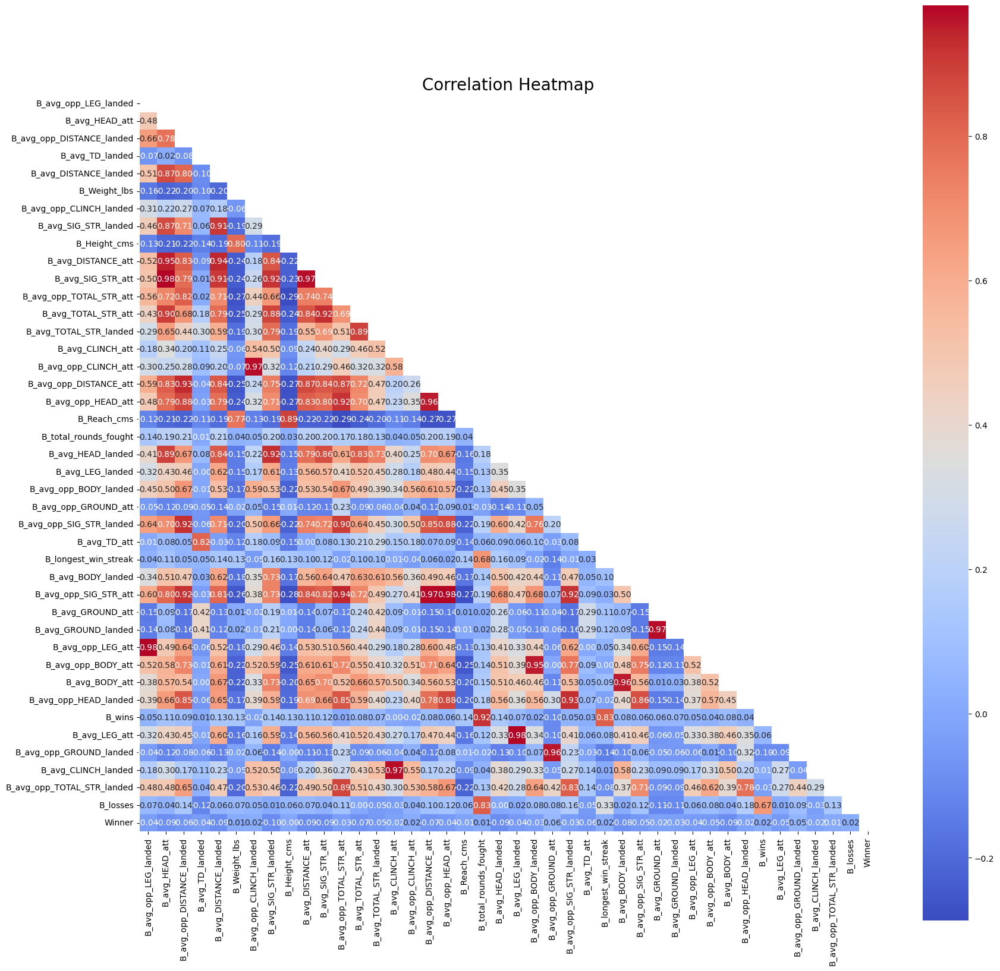

In [ ]:
# Set a threshold for high correlation
threshold = 0.8

# Find the indices where correlation is above the threshold
high_corr_pairs = correlation_matrix_b[(correlation_matrix_b > threshold) & (correlation_matrix_b < 1.0)].stack().reset_index()
high_corr_pairs.columns = ['Feature 1', 'Feature 2', 'Correlation']

# Display the high correlations
# print("Highly correlated features (correlation > 0.8):")

# high_corr_pairs



# Assuming you have the DataFrame with correlations named `correlation_df`
# Extract unique feature names from both "Feature 1" and "Feature 2"
unique_features = set(high_corr_pairs['Feature 1']).union(set(high_corr_pairs['Feature 2']))

# Convert the set to a list (if needed)
unique_feature_list = list(unique_features)

len(unique_feature_list)

df_b_target=df_b[unique_feature_list].copy()
df_b_target['Winner']=df_b['Winner']




# Compute the correlation matrix
numeric_df_b = df_b_target.select_dtypes(include=['number'])

correlation_matrix_b_target = numeric_df_b.corr()

# Display the correlation matrix
# print("Correlation Matrix:")
# print(correlation_matrix)
# Plot heatmap
plt.figure(figsize=(20, 20))  # Adjust the figure size as needed
sns.heatmap(
    correlation_matrix_b_target,
    annot=True,  # Show correlation values
    fmt=".2f",  # Format decimal places
    cmap="coolwarm",  # Color map
    square=True,
    cbar=True,
    mask=np.triu(correlation_matrix_b_target)  # Show only the lower triangle
)
plt.title("Correlation Heatmap", fontsize=20)
plt.show()




In [ ]:
# Extract correlations with the 'Winner' column (assuming 'Winner' is numeric or encoded)
winner_corr = correlation_matrix_b_target['Winner']
# winner_corr


# Create a list of tuples (feature, correlation with Winner)
correlation_list = [(feature, winner_corr[feature]) for feature in winner_corr.index]

# Print the list of tuples
# correlation_list



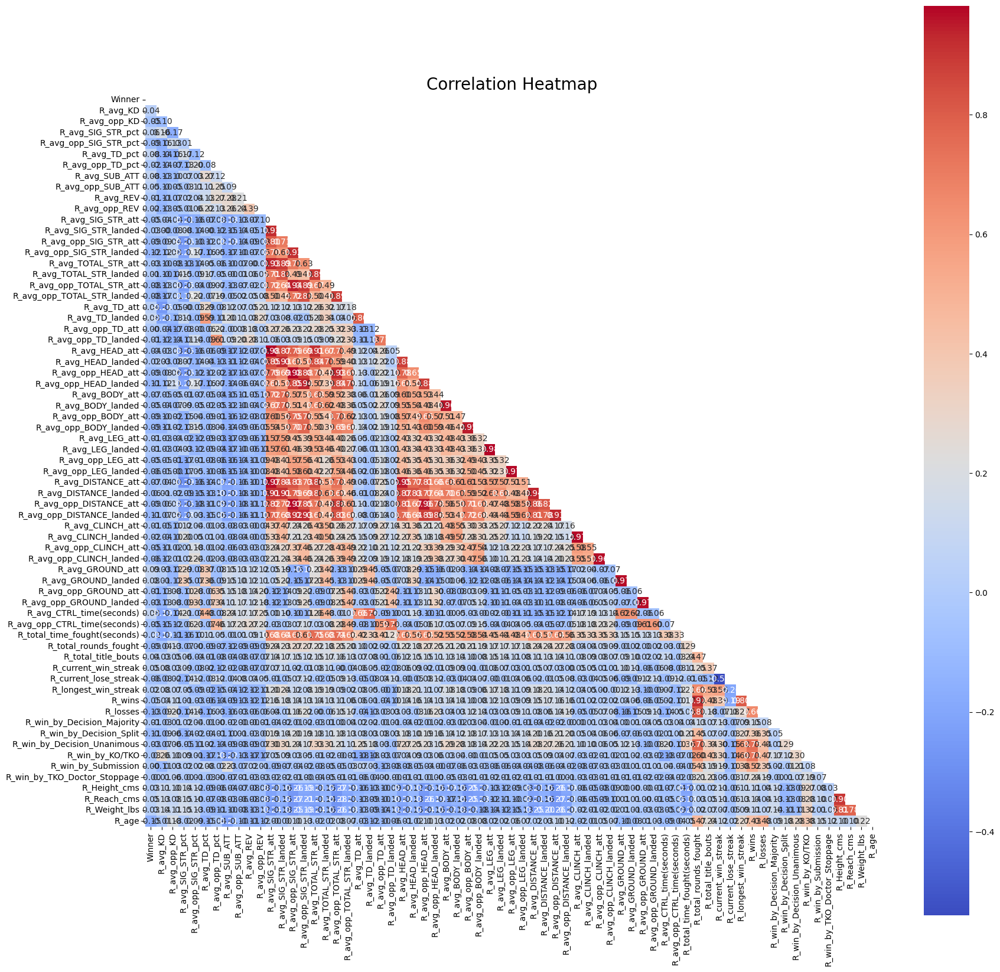

In [ ]:
final_list =[]
for index, row in high_corr_pairs.iterrows():
    temp1 = high_corr_pairs.iloc[index]['Feature 1']
    matches = [t for t in correlation_list if temp1 in t]
    for cookie in matches:
        corr1=cookie[1]
#         print(corr1)
    temp2 = high_corr_pairs.iloc[index]['Feature 2']
    matches_2 = [t for t in correlation_list if temp2 in t]
    for choco in matches_2:
        corr2=choco[1]
    if abs(corr1)>abs(corr2):
        if temp1 not in final_list:
            final_list.append(temp1)
    else:
        if temp2 not in final_list:
            final_list.append(temp2)


#final_list



b_columns_w = [ i for i in b_columns if i !='Winner']

delete_these_b = [col for col in b_columns_w if col not in final_list]
# delete_these_b
delete_these_b =delete_these_b[2:]
# here the fighter names should remain
# delete_these_b



numeric_df_r = df_r.select_dtypes(include=['number'])

correlation_matrix_r = numeric_df_r.corr()
# Plot heatmap
plt.figure(figsize=(20, 20))  # Adjust the figure size as needed
sns.heatmap(
    correlation_matrix_r,
    annot=True,  # Show correlation values
    fmt=".2f",  # Format decimal places
    cmap="coolwarm",  # Color map
    square=True,
    cbar=True,
    mask=np.triu(correlation_matrix_r)  # Show only the lower triangle
)
plt.title("Correlation Heatmap", fontsize=20)
plt.show()





In [ ]:
len(final_list)
#******************************** Features that remained of B fighter ***************************************


27

In [ ]:
# # Display the correlation matrix
# print("Correlation matrix for features starting with 'R_':")
# correlation_matrix_r


# Set a threshold for high correlation
threshold = 0.8

# Find the indices where correlation is above the threshold
high_corr_pairs_r = correlation_matrix_r[(correlation_matrix_r > threshold) & (correlation_matrix_r < 1.0)].stack().reset_index()
high_corr_pairs_r.columns = ['Feature 1', 'Feature 2', 'Correlation']

# Display the high correlations
print("Highly correlated features (correlation > 0.8):")
high_corr_pairs_r


Highly correlated features (correlation > 0.8):


,Feature 1,Feature 2,Correlation
0,R_avg_SIG_STR_att,R_avg_SIG_STR_landed,0.917252
1,R_avg_SIG_STR_att,R_avg_opp_SIG_STR_att,0.801510
2,R_avg_SIG_STR_att,R_avg_TOTAL_STR_att,0.933836
3,R_avg_SIG_STR_att,R_avg_HEAD_att,0.976909
4,R_avg_SIG_STR_att,R_avg_HEAD_landed,0.851280
...,...,...,...
123,R_losses,R_total_rounds_fought,0.814854
124,R_Height_cms,R_Reach_cms,0.898223
125,R_Height_cms,R_Weight_lbs,0.806154
126,R_Reach_cms,R_Height_cms,0.898223


In [ ]:
# Assuming you have the DataFrame with correlations named `correlation_df`
# Extract unique feature names from both "Feature 1" and "Feature 2"
unique_features = set(high_corr_pairs_r['Feature 1']).union(set(high_corr_pairs_r['Feature 2']))

# Convert the set to a list (if needed)
unique_feature_list = list(unique_features)

len(unique_feature_list)

df_r_target=df_r[unique_feature_list].copy()
df_r_target['Winner']=df_r['Winner']


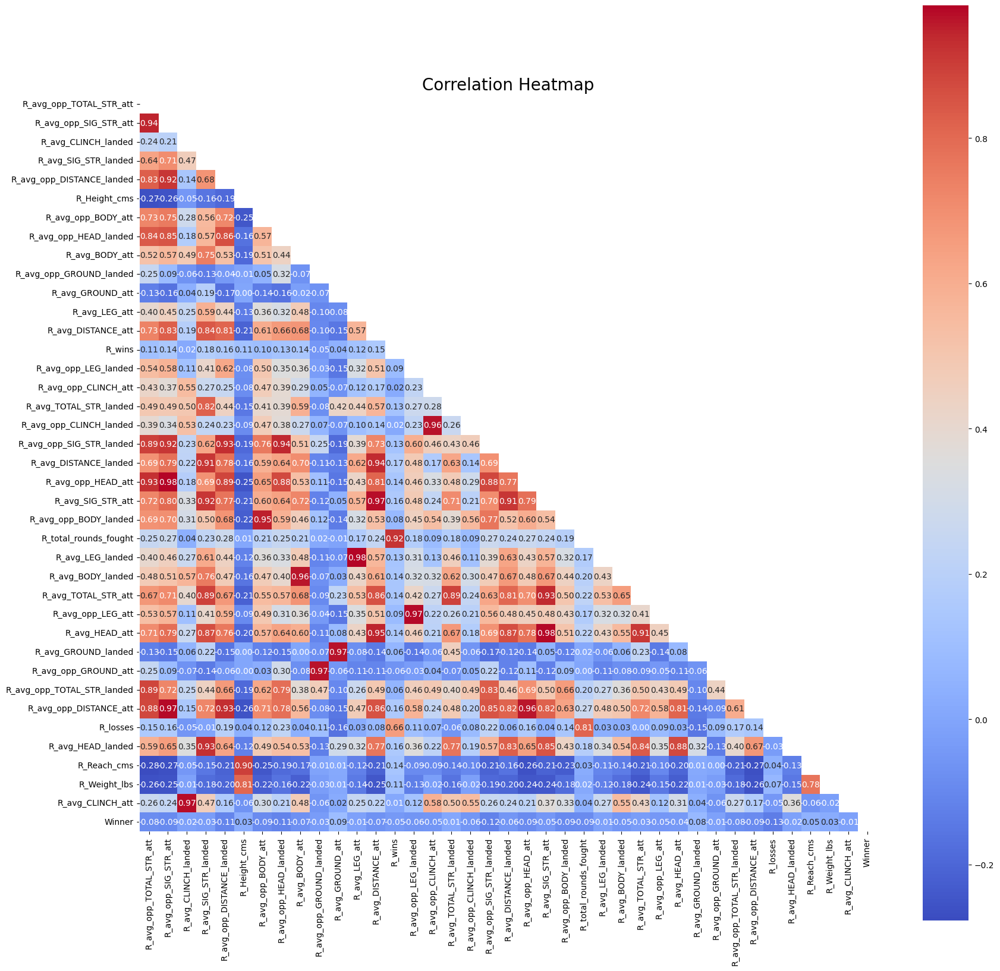

In [ ]:
# Compute the correlation matrix
numeric_df_r = df_r_target.select_dtypes(include=['number'])

correlation_matrix_r_t = df_r_target.corr()

# Display the correlation matrix
# print("Correlation Matrix:")
# print(correlation_matrix)
# Plot heatmap
plt.figure(figsize=(20, 20))  # Adjust the figure size as needed
sns.heatmap(
    correlation_matrix_r_t,
    annot=True,  # Show correlation values
    fmt=".2f",  # Format decimal places
    cmap="coolwarm",  # Color map
    square=True,
    cbar=True,
    mask=np.triu(correlation_matrix_r_t)  # Show only the lower triangle
)
plt.title("Correlation Heatmap", fontsize=20)
plt.show()

In [ ]:
# Extract correlations with the 'Winner' column (assuming 'Winner' is numeric or encoded)
winner_corr = correlation_matrix_r_t['Winner']
# winner_corr

# Create a list of tuples (feature, correlation with Winner)
correlation_list_r = [(feature, winner_corr[feature]) for feature in winner_corr.index]


# Print the list of tuples
# correlation_list


final_list_r =[]
for index, row in high_corr_pairs_r.iterrows():
    temp1 = high_corr_pairs_r.iloc[index]['Feature 1']
    matches = [t for t in correlation_list_r if temp1 in t]
    for cookie in matches:
        corr1=cookie[1]
#         print(corr1)
    temp2 = high_corr_pairs_r.iloc[index]['Feature 2']
    matches_2 = [t for t in correlation_list_r if temp2 in t]
    for choco in matches_2:
        corr2=choco[1]
    if abs(corr1)>abs(corr2):
        if temp1 not in final_list_r:
            final_list_r.append(temp1)
    else:
        if temp2 not in final_list_r:
            final_list_r.append(temp2)

#******************************** Features that remained of R fighter ***************************************
len(final_list_r)


25

In [ ]:
r_columns_w = [ i for i in r_columns if i !='Winner']
delete_r = [col for col in r_columns_w if col not in final_list_r]
# delete_r = delete_r[2:]
# here the fighter names should remain
#delete_r
# for i in r_columns:
#   # if i == 'Winner':
#     print(i)

# r_columns
# delete_final = delete_r + delete_these_b
# print(len(delete_final))


df_feature_removed=df.copy()
# df_feature_removed['Winner'] = df_feature_removed['Winner'].apply(lambda x: 1 if x == 'Red' else 0)
# for i in df_feature_removed.columns:
#     print(i)
# df_feature_removed.head()
#df_feature_removed=df_feature_removed.drop(columns=delete_final)

In [ ]:
df_feature_removed.head()
# datasets going further that can be used
# df_feature_removed -scaled,
#df -with all the features scaled



,Winner,title_bout,B_avg_KD,B_avg_opp_KD,B_avg_SIG_STR_pct,B_avg_opp_SIG_STR_pct,B_avg_TD_pct,B_avg_opp_TD_pct,B_avg_SUB_ATT,B_avg_opp_SUB_ATT,...,weight_class_WomenFlyweight,weight_class_WomenStrawweight,B_Stance_Open Stance,B_Stance_Orthodox,B_Stance_Southpaw,B_Stance_Switch,R_Stance_Open Stance,R_Stance_Orthodox,R_Stance_Southpaw,R_Stance_Switch
0,1,False,-0.691325,-0.560926,-0.290687,0.551027,0.131968,0.408563,0.043622,1.042934,...,False,False,False,True,False,False,False,True,False,False
1,1,False,0.610415,-0.560926,1.698022,-1.008104,0.018143,0.968127,1.474621,-0.633924,...,False,False,False,True,False,False,False,True,False,False
4,0,False,-0.365890,-0.560926,0.667415,1.238276,-0.418183,-0.365834,-0.493002,-0.319513,...,False,False,False,True,False,False,False,True,False,False
5,0,False,-0.691325,-0.560926,0.496510,0.376651,0.530352,-0.031095,1.116871,0.414112,...,False,False,False,False,False,True,False,True,False,False
6,0,False,-0.569287,-0.155248,0.034776,-0.190073,0.102326,-0.755062,-0.400770,-0.633924,...,False,False,False,True,False,False,False,True,False,False


****

Classification Report:
              precision    recall  f1-score   support

           0       0.54      0.15      0.23       278
           1       0.66      0.93      0.77       487

    accuracy                           0.64       765
   macro avg       0.60      0.54      0.50       765
weighted avg       0.61      0.64      0.57       765

Confusion Matrix:
[[ 41 237]
 [ 35 452]]


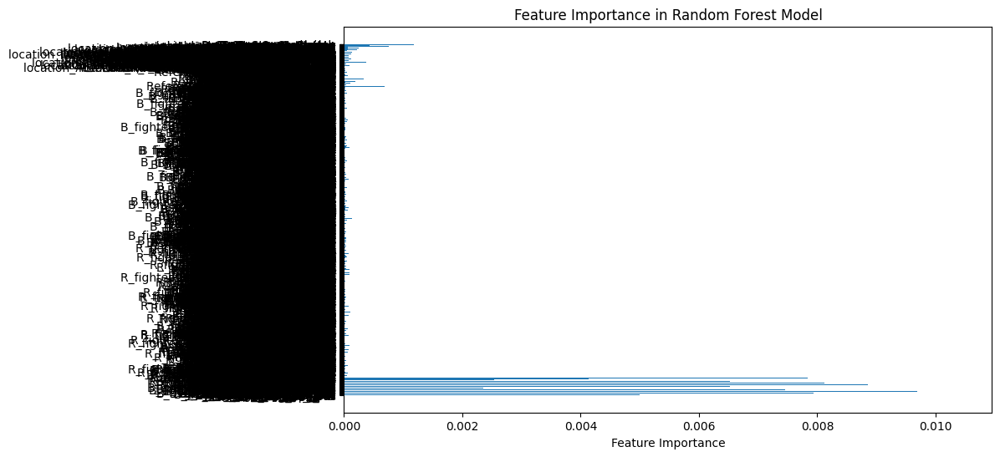

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder

# # Handle categorical variables (e.g., 'weight_class') using Label Encoding or One-Hot Encoding
# label_encoder = LabelEncoder()
# df_cleaned['weight_class'] = label_encoder.fit_transform(df_cleaned['weight_class'])


# ---------------------------------------------------------------------
# Step 2: Separate features (X) and target (y)
X = df_feature_removed.drop(columns=['Winner'])  # Features
y = df_feature_removed['Winner']  # Target variable



# Step 3: Handle class imbalance by using class_weight='balanced' in the RandomForest model

# Split data into train and test sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Check the data types of the features and target variable
# print(X_train.dtypes)
# print(y_train.dtypes)
y_train = y_train.astype('int')
X_train = X_train.apply(pd.to_numeric, errors='coerce')  # Convert to numeric, set errors='coerce' to handle non-numeric values

# Step 4: Create and train the Random Forest model
rf_model = RandomForestClassifier(class_weight='balanced', random_state=42)
rf_model.fit(X_train, y_train)

# Step 5: Make predictions on the test set
y_pred = rf_model.predict(X_test)

# Step 6: Evaluate the model
print("Classification Report:")
print(classification_report(y_test, y_pred))

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

# Step 7: Feature Importance (optional)
feature_importances = rf_model.feature_importances_
features = X.columns

plt.figure(figsize=(10, 6))
plt.barh(features, feature_importances)
plt.xlabel('Feature Importance')
plt.title('Feature Importance in Random Forest Model')
plt.show()



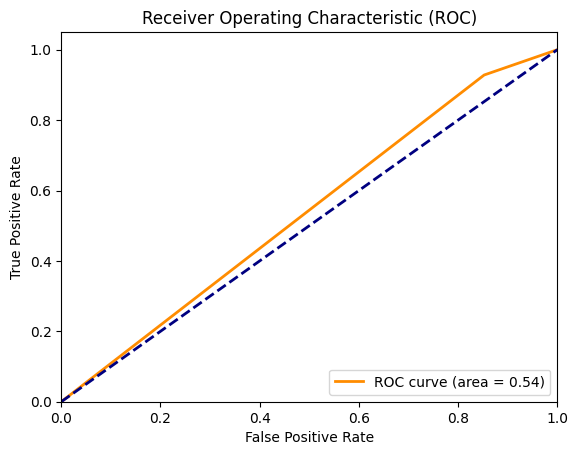

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, rf_model.predict(X_test))
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()


****

                   Feature  Importance
3        B_avg_SIG_STR_pct    0.007780
4    B_avg_opp_SIG_STR_pct    0.008000
5             B_avg_TD_pct    0.007164
6         B_avg_opp_TD_pct    0.007464
7            B_avg_SUB_ATT    0.005995
..                     ...         ...
121               R_losses    0.005453
128           R_Height_cms    0.005881
129            R_Reach_cms    0.005631
131                  B_age    0.007832
132                  R_age    0.010396

[106 rows x 2 columns]


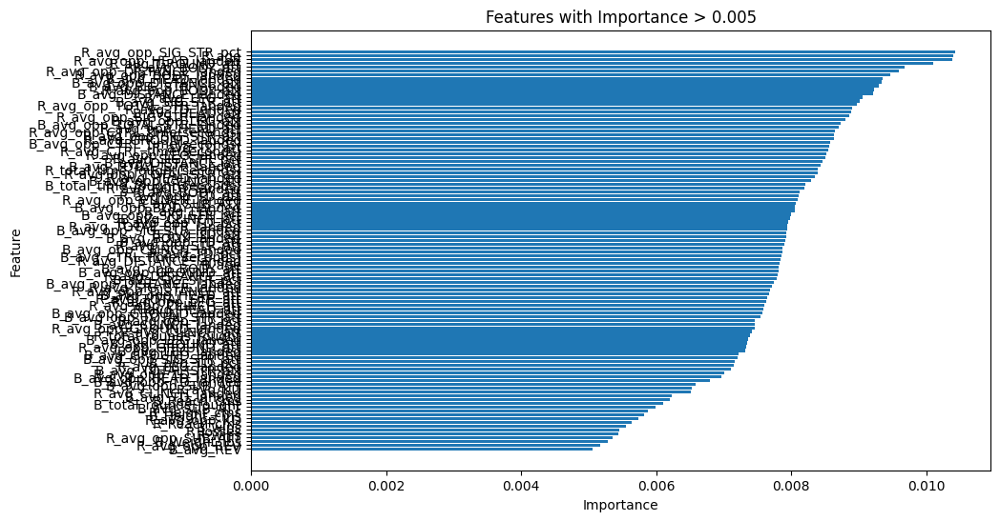

In [ ]:
from sklearn.ensemble import RandomForestClassifier
import pandas as pd

# Assuming you've already trained the Random Forest model
# Example: rf_model.fit(X_train, y_train)

# Get feature importance scores
importances = rf_model.feature_importances_

# Create a DataFrame to map features to their importance
feature_importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': importances
})

# Filter features with importance greater than 0.005
important_features = feature_importance_df[feature_importance_df['Importance'] > 0.005]

# Display important features
print(important_features)


import matplotlib.pyplot as plt

# Sort important features for better visualization
important_features_sorted = important_features.sort_values(by='Importance', ascending=False)

# Plot
plt.figure(figsize=(10, 6))
plt.barh(important_features_sorted['Feature'], important_features_sorted['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Features with Importance > 0.005')
plt.gca().invert_yaxis()  # Highest importance at the top
plt.show()

# Get feature importances
feature_importances = rf_model.feature_importances_

# Set a threshold for selecting important features
threshold = 0.005
important_features = X.columns[feature_importances > threshold]

# Filter the features based on importance
X_important = X[important_features]




In [ ]:
# from sklearn.metrics import roc_curve, auc
# import matplotlib.pyplot as plt

# # Compute ROC curve and AUC
# fpr, tpr, thresholds = roc_curve(y_test, model.predict(X_test))
# roc_auc = auc(fpr, tpr)

# # Plot ROC curve
# plt.figure()
# plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
# plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
# plt.xlim([0.0, 1.0])
# plt.ylim([0.0, 1.05])
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.title('Receiver Operating Characteristic (ROC)')
# plt.legend(loc='lower right')
# plt.show()


****

Classification Report:
              precision    recall  f1-score   support

           0       0.53      0.21      0.30       278
           1       0.66      0.90      0.76       487

    accuracy                           0.65       765
   macro avg       0.60      0.55      0.53       765
weighted avg       0.62      0.65      0.59       765

Confusion Matrix:
[[ 57 221]
 [ 50 437]]


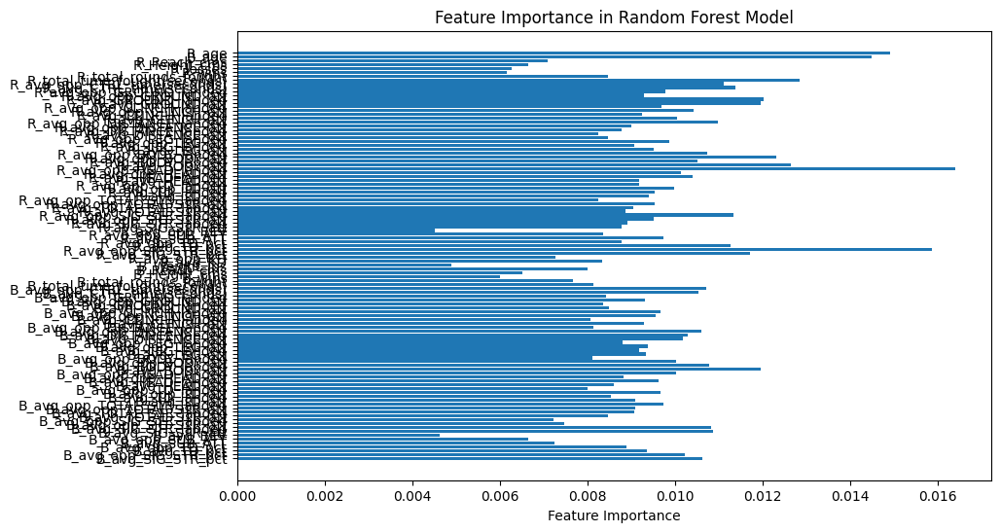

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder

# # Handle categorical variables (e.g., 'weight_class') using Label Encoding or One-Hot Encoding
# label_encoder = LabelEncoder()
# df_cleaned['weight_class'] = label_encoder.fit_transform(df_cleaned['weight_class'])


# ---------------------------------------------------------------------
# Step 2: Separate features (X) and target (y)
X = X_important


# Step 3: Handle class imbalance by using class_weight='balanced' in the RandomForest model

# Split data into train and test sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Check the data types of the features and target variable
# print(X_train.dtypes)
# print(y_train.dtypes)
y_train = y_train.astype('int')
X_train = X_train.apply(pd.to_numeric, errors='coerce')  # Convert to numeric, set errors='coerce' to handle non-numeric values

# Step 4: Create and train the Random Forest model
rf_model = RandomForestClassifier(class_weight='balanced', random_state=42)
rf_model.fit(X_train, y_train)

# Step 5: Make predictions on the test set
y_pred = rf_model.predict(X_test)

# Step 6: Evaluate the model
print("Classification Report:")
print(classification_report(y_test, y_pred))

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

# Step 7: Feature Importance (optional)
feature_importances = rf_model.feature_importances_
features = X.columns

plt.figure(figsize=(10, 6))
plt.barh(features, feature_importances)
plt.xlabel('Feature Importance')
plt.title('Feature Importance in Random Forest Model')
plt.show()

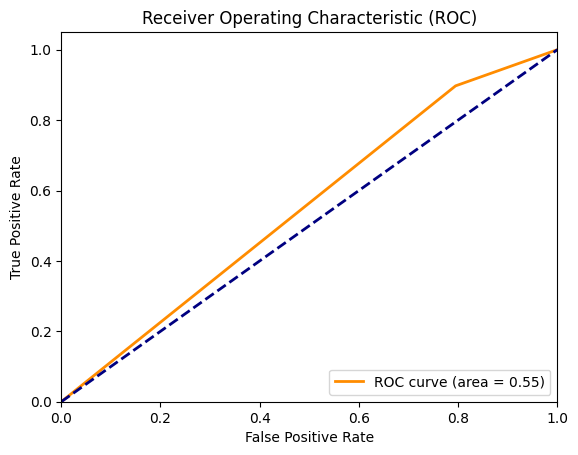

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, rf_model.predict(X_test))
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.9/57.9 kB 3.5 MB/s eta 0:00:00
Selected Features: ['B_avg_SIG_STR_landed', 'R_avg_opp_SIG_STR_pct', 'R_avg_opp_HEAD_landed', 'R_avg_GROUND_att', 'R_age']
Classification Report:
              precision    recall  f1-score   support

           0       0.42      0.29      0.34       278
           1       0.65      0.77      0.71       487

    accuracy                           0.59       765
   macro avg       0.54      0.53      0.52       765
weighted avg       0.57      0.59      0.57       765

Confusion Matrix:
[[ 80 198]
 [112 375]]


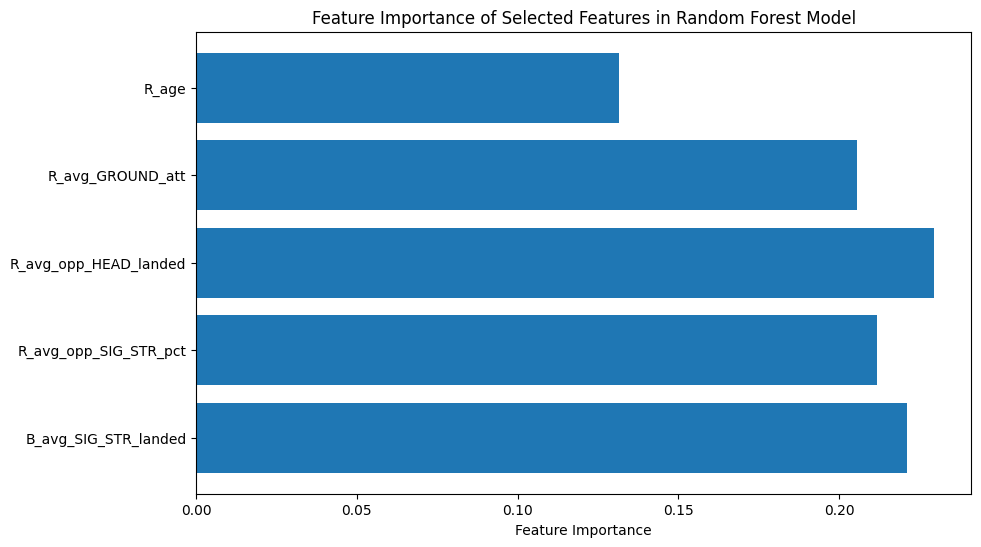

In [ ]:
!pip install boruta


import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from boruta import BorutaPy

# Assumizng df_feature_removed is your cleaned DataFrame
# Step 1: Separate features (X) and target (y)
X = df_feature_removed.drop(columns=['Winner'])  # Features
y = df_feature_removed['Winner']  # Target variable

# Step 2: Handle class imbalance by using class_weight='balanced' in the RandomForest model
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Convert non-numeric values to numeric if needed
X_train = X_train.apply(pd.to_numeric, errors='coerce')
X_test = X_test.apply(pd.to_numeric, errors='coerce')
y_train = y_train.astype('int')

# Step 3: Create and train the Random Forest model for Boruta
rf_model = RandomForestClassifier(n_jobs=-1, class_weight='balanced', random_state=42)

# Step 4: Use Boruta for feature selection
boruta = BorutaPy(rf_model, n_estimators='auto', random_state=42)
boruta.fit(np.array(X_train), np.array(y_train))

# Step 5: Get the features that are selected by Boruta
selected_features = X.columns[boruta.support_].tolist()
print(f"Selected Features: {selected_features}")

# Step 6: Create a new dataset with only selected features
X_train_selected = X_train[selected_features]
X_test_selected = X_test[selected_features]

# Step 7: Train the Random Forest model using only selected features
rf_model.fit(X_train_selected, y_train)

# Step 8: Make predictions and evaluate the model
y_pred = rf_model.predict(X_test_selected)

print("Classification Report:")
print(classification_report(y_test, y_pred))

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

# Step 9: Plot the feature importance (based on Boruta selection)
feature_importances = rf_model.feature_importances_
plt.figure(figsize=(10, 6))
plt.barh(selected_features, feature_importances)
plt.xlabel('Feature Importance')
plt.title('Feature Importance of Selected Features in Random Forest Model')
plt.show()


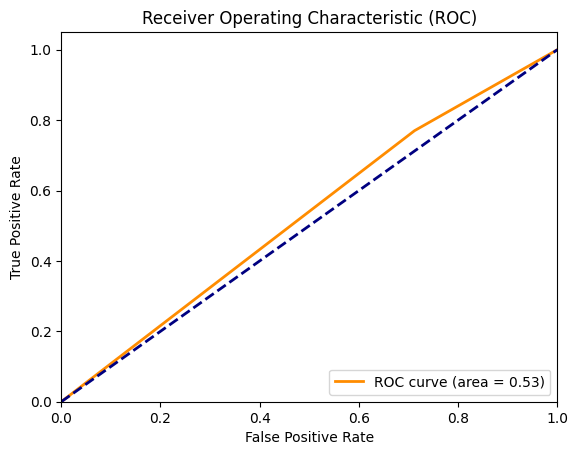

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, rf_model.predict(X_test_selected))
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()


****

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
import xgboost as xgb
# Define the XGBoost model
model = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss')

# Define the parameter distribution for RandomizedSearchCV
param_dist = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 6, 9],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
    'gamma': [0, 0.1, 0.2],
    'scale_pos_weight': [1, 10],
}

# Perform RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=model, param_distributions=param_dist, n_iter=100, cv=3, n_jobs=-1, verbose=2, scoring='accuracy')

# Fit the random search
random_search.fit(X_train, y_train)

# Get the best parameters and best score
print("Best parameters found: ", random_search.best_params_)
print("Best accuracy score found: ", random_search.best_score_)


Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best parameters found:  {'subsample': 0.8, 'scale_pos_weight': 1, 'n_estimators': 300, 'max_depth': 3, 'learning_rate': 0.01, 'gamma': 0, 'colsample_bytree': 1.0}
Best accuracy score found:  0.6426700805198928


In [ ]:
# Get the best model
best_model = random_search.best_estimator_
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Make predictions on the test set
y_pred = best_model.predict(X_test)

# Evaluate performance
accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {accuracy}")

# Classification report for more detailed evaluation
print("Classification Report:\n", classification_report(y_test, y_pred))

# Confusion matrix to see class-wise performance
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))


Test Accuracy: 0.6549019607843137
Classification Report:
               precision    recall  f1-score   support

           0       0.59      0.17      0.27       278
           1       0.66      0.93      0.77       487

    accuracy                           0.65       765
   macro avg       0.62      0.55      0.52       765
weighted avg       0.63      0.65      0.59       765

Confusion Matrix:
 [[ 48 230]
 [ 34 453]]


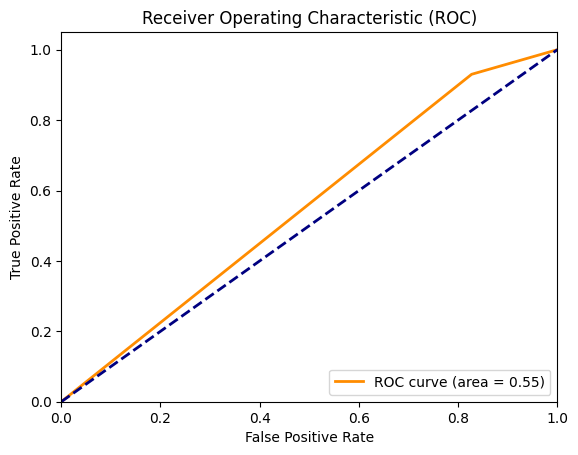

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, best_model.predict(X_test))
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Input
from sklearn.preprocessing import StandardScaler

# Define the dataset (assuming df_feature_removed is defined)
X = df_feature_removed.drop(columns=['Winner'])  # Features
y = df_feature_removed['Winner']  # Target variable

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Define the MLP model function
def create_mlp_model(optimizer='adam', dropout_rate=0.0, units=128, input_shape=(None,)):
    model = Sequential([
        Input(shape=input_shape),
        Dense(units=units, activation='relu'),
        Dense(units=64, activation='relu'),
        Dense(units=32, activation='relu'),
        Dropout(dropout_rate),
        Dense(units=1, activation='sigmoid')
    ])

    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Set up the hyperparameter grid
param_grid = {
    'batch_size': [32, 64],
    'epochs': [50, 100],
    'optimizer': ['adam', 'sgd'],
    'units': [64, 128],
    'dropout_rate': [0.0, 0.2],
}

# Create a function to train and evaluate the model
def train_and_evaluate(optimizer='adam', dropout_rate=0.0, units=128, batch_size=32, epochs=50):
    # Create the model
    model = create_mlp_model(optimizer=optimizer, dropout_rate=dropout_rate, units=units, input_shape=(X_train.shape[1],))

    # Train the model
    model.fit(X_train, y_train, batch_size=batch_size, epochs=epochs, verbose=0)

    # Evaluate the model
    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)

    return test_accuracy

# Grid search function
def grid_search(param_grid):
    best_accuracy = 0
    best_params = {}

    # Iterate over all parameter combinations
    for batch_size in param_grid['batch_size']:
        for epochs in param_grid['epochs']:
            for optimizer in param_grid['optimizer']:
                for units in param_grid['units']:
                    for dropout_rate in param_grid['dropout_rate']:
                        accuracy = train_and_evaluate(optimizer=optimizer, dropout_rate=dropout_rate,
                                                      units=units, batch_size=batch_size, epochs=epochs)
                        if accuracy > best_accuracy:
                            best_accuracy = accuracy
                            best_params = {
                                'batch_size': batch_size,
                                'epochs': epochs,
                                'optimizer': optimizer,
                                'units': units,
                                'dropout_rate': dropout_rate
                            }
    return best_params, best_accuracy

# Perform grid search
best_params, best_accuracy = grid_search(param_grid)

# Print the best parameters and accuracy
print(f"Best Parameters: {best_params}")
print(f"Best Accuracy: {best_accuracy:.4f}")

# Re-train the best model with the optimal hyperparameters
best_model = create_mlp_model(optimizer=best_params['optimizer'],
                              dropout_rate=best_params['dropout_rate'],
                              units=best_params['units'],
                              input_shape=(X_train.shape[1],))

best_model.fit(X_train, y_train, batch_size=best_params['batch_size'], epochs=best_params['epochs'], verbose=0)

# Evaluate the final model
test_loss, test_accuracy = best_model.evaluate(X_test, y_test)
print(f"Final Test Accuracy: {test_accuracy:.4f}")

# Make predictions and evaluate
y_pred = (best_model.predict(X_test) > 0.5).astype("int32")
print("Classification Report:")
print(classification_report(y_test, y_pred))

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))



Best Parameters: {'batch_size': 32, 'epochs': 50, 'optimizer': 'sgd', 'units': 128, 'dropout_rate': 0.2}
Best Accuracy: 0.6575
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6358 - loss: 2.4710
Final Test Accuracy: 0.6458
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.51      0.44      0.48       278
           1       0.71      0.76      0.73       487

    accuracy                           0.65       765
   macro avg       0.61      0.60      0.60       765
weighted avg       0.64      0.65      0.64       765

Confusion Matrix:
[[123 155]
 [116 371]]


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


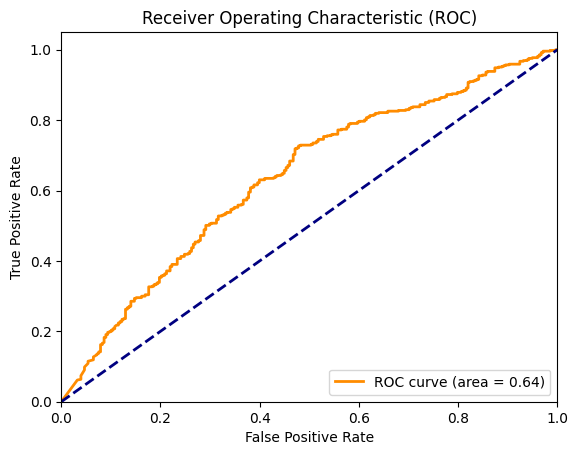

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, best_model.predict(X_test))
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()


In [ ]:
# Re-train the best model with the optimal hyperparameters
# Ensure input_shape is explicitly passed during model creation
best_model = create_mlp_model(
    optimizer=best_params['optimizer'],
    dropout_rate=best_params['dropout_rate'],
    units=best_params['units'],
    input_shape=(X_train.shape[1],)  # Explicitly specify input shape
)

# Train the model
best_model.fit(X_train, y_train, batch_size=best_params['batch_size'], epochs=best_params['epochs'], verbose=0)

# Evaluate the final model
test_loss, test_accuracy = best_model.evaluate(X_test, y_test)
print(f"Final Test Accuracy: {test_accuracy:.4f}")

# Make predictions and evaluate
y_pred = (best_model.predict(X_test) > 0.5).astype("int32")
print("Classification Report:")
print(classification_report(y_test, y_pred))

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6373 - loss: 2.2164
Final Test Accuracy: 0.6418
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.51      0.50      0.50       278
           1       0.72      0.72      0.72       487

    accuracy                           0.64       765
   macro avg       0.61      0.61      0.61       765
weighted avg       0.64      0.64      0.64       765

Confusion Matrix:
[[138 140]
 [134 353]]


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


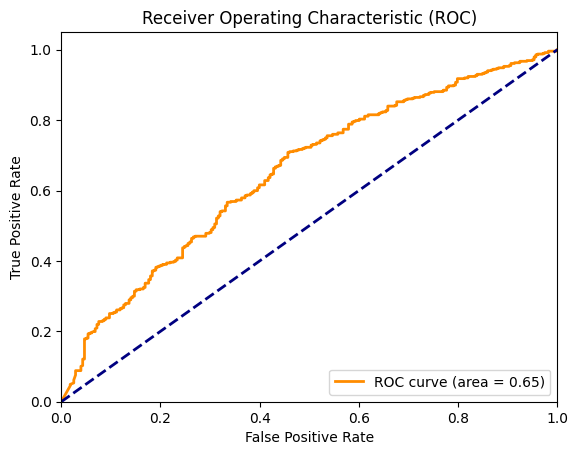

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, best_model.predict(X_test))
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()


In [ ]:
pip install keras-tuner


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 4.1 MB/s eta 0:00:00


In [ ]:
import keras_tuner as kt
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.optimizers import Adam

# Define the model-building function
def build_model(hp):
    model = Sequential()

    # First hidden layer
    model.add(Dense(units=hp.Int('units_1', min_value=32, max_value=128, step=32),
                    activation='relu', input_dim=X_train.shape[1]))

    # Dropout layer
    model.add(Dropout(rate=hp.Float('dropout_rate', min_value=0.2, max_value=0.5, step=0.1)))

    # Second hidden layer
    model.add(Dense(units=hp.Int('units_2', min_value=32, max_value=128, step=32), activation='relu'))

    # Output layer
    model.add(Dense(units=1, activation='sigmoid'))  # Sigmoid for binary classification

    # Compile the model
    model.compile(optimizer=Adam(learning_rate=hp.Float('learning_rate', min_value=1e-4, max_value=1e-2, sampling='log')),
                  loss='binary_crossentropy', metrics=['accuracy'])

    return model

# Initialize the tuner
tuner = kt.Hyperband(build_model,
                     objective='val_accuracy',  # Optimize validation accuracy
                     max_epochs=10,
                     factor=3,
                     directory='kt_dir',
                     project_name='tune_nn')

# Perform the hyperparameter search
tuner.search(X_train, y_train, epochs=10, validation_data=(X_test, y_test))

# Get the best hyperparameters
best_hyperparameters = tuner.get_best_hyperparameters(num_trials=1)[0]

# Print the best hyperparameters
print("Best Hyperparameters: ", best_hyperparameters.values)

# Build the model with the best hyperparameters
best_model = tuner.hypermodel.build(best_hyperparameters)

# Train the best model
best_model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the best model on the test set
test_loss, test_acc = best_model.evaluate(X_test, y_test)
print(f"Test Accuracy: {test_acc}")


Trial 30 Complete [00h 00m 18s]
val_accuracy: 0.6457516551017761

Best val_accuracy So Far: 0.6692810654640198
Total elapsed time: 00h 05m 48s
Best Hyperparameters:  {'units_1': 64, 'dropout_rate': 0.2, 'units_2': 96, 'learning_rate': 0.000929184356170649, 'tuner/epochs': 4, 'tuner/initial_epoch': 0, 'tuner/bracket': 1, 'tuner/round': 0}
Epoch 1/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.5481 - loss: 0.7190 - val_accuracy: 0.6327 - val_loss: 0.6298
Epoch 2/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.7925 - loss: 0.4690 - val_accuracy: 0.6405 - val_loss: 0.7011
Epoch 3/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.9071 - loss: 0.2636 - val_accuracy: 0.6444 - val_loss: 0.9280
Epoch 4/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.9723 - loss: 0.1181 - val_accuracy: 0.6405 - val_loss: 1.3180
Epoch 5/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.9865 - loss: 0.0580 - val_accuracy: 0.6458 - val_loss: 1.6181
Epoch 6/10
96/96 ━━━━━━━━━━

24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step


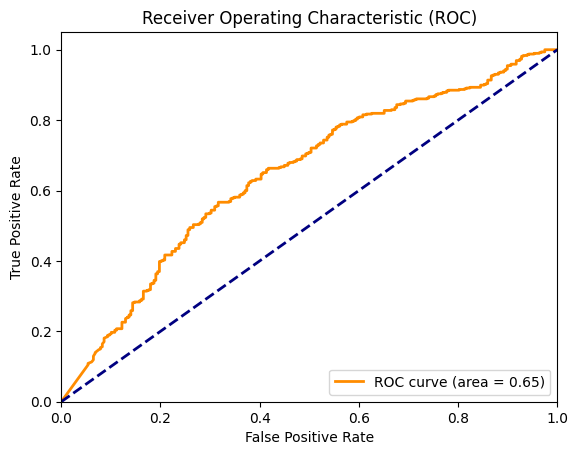

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, best_model.predict(X_test))
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()


I have tried this and didn't include it
[Random forest on the whole dataset](https://colab.research.google.com/drive/1yNLICGLXm9O5jj2bFVLc0AuxXm0Xhuwg?usp=sharing)

[Outputs of my code (because it takes 2 hours to run) a collab](https://colab.research.google.com/drive/1Iw-tCjDEObnK5QNTNT-X0frgIMFVrrJI?usp=sharing)



****


#Andrew's Section

<ipython-input-53-fa84aff2dc0a>:9: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  y = targetVar.replace(['Red', 'Blue'], [1, 0])  # Encode the target variable
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


==== Gradient Boosting Classifier ====
Classification Report:
              precision    recall  f1-score   support

           0       0.52      0.38      0.44       280
           1       0.69      0.80      0.74       489

    accuracy                           0.65       769
   macro avg       0.61      0.59      0.59       769
weighted avg       0.63      0.65      0.63       769

Confusion Matrix:
[[107 173]
 [ 97 392]]
ROC AUC Score: 0.6439


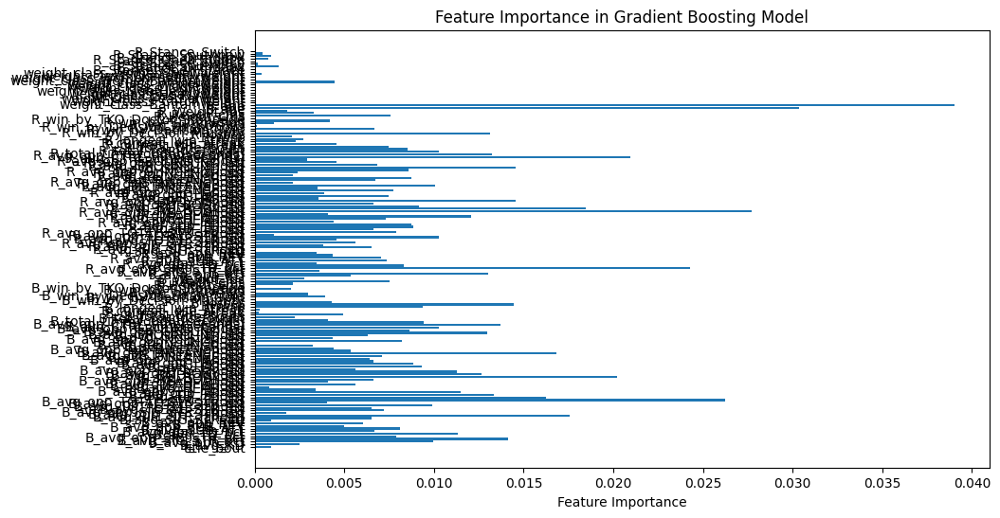


==== Logistic Regression ====


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Classification Report:
              precision    recall  f1-score   support

           0       0.48      0.66      0.55       280
           1       0.75      0.58      0.66       489

    accuracy                           0.61       769
   macro avg       0.61      0.62      0.60       769
weighted avg       0.65      0.61      0.62       769

Confusion Matrix:
[[185  95]
 [204 285]]
ROC AUC Score: 0.6511


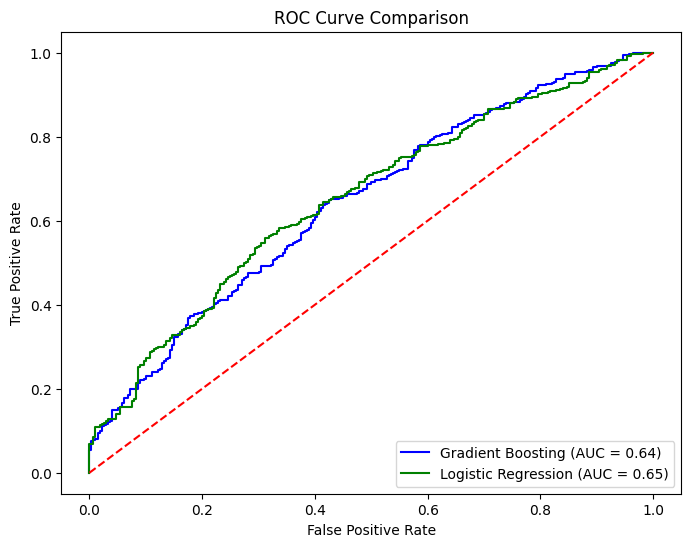

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
import matplotlib.pyplot as plt

# Use the preprocessed features and target variable
X = allFeaturesEncoded  # Adjust this based on final preprocessed data
y = targetVar.replace(['Red', 'Blue'], [1, 0])  # Encode the target variable

# Split into train and test datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 1. Gradient Boosting Classifier
print("==== Gradient Boosting Classifier ====")
gb_model = GradientBoostingClassifier(n_estimators=200, learning_rate=0.1, max_depth=3, random_state=42)
gb_model.fit(X_train, y_train)
y_pred_gb = gb_model.predict(X_test)

# Evaluate Gradient Boosting
print("Classification Report:")
print(classification_report(y_test, y_pred_gb))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_gb))
roc_auc_gb = roc_auc_score(y_test, gb_model.predict_proba(X_test)[:, 1])
print(f"ROC AUC Score: {roc_auc_gb:.4f}")

# Feature Importance
gb_feature_importances = gb_model.feature_importances_
features = X.columns
plt.figure(figsize=(10, 6))
plt.barh(features, gb_feature_importances)
plt.xlabel('Feature Importance')
plt.title('Feature Importance in Gradient Boosting Model')
plt.show()

# 2. Logistic Regression
print("\n==== Logistic Regression ====")
lr_model = LogisticRegression(max_iter=1000, random_state=42, solver='liblinear', class_weight='balanced')
lr_model.fit(X_train, y_train)
y_pred_lr = lr_model.predict(X_test)

# Evaluate Logistic Regression
print("Classification Report:")
print(classification_report(y_test, y_pred_lr))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_lr))
roc_auc_lr = roc_auc_score(y_test, lr_model.predict_proba(X_test)[:, 1])
print(f"ROC AUC Score: {roc_auc_lr:.4f}")

# Compare ROC curves
from sklearn.metrics import roc_curve
plt.figure(figsize=(8, 6))
# Gradient Boosting ROC
fpr_gb, tpr_gb, _ = roc_curve(y_test, gb_model.predict_proba(X_test)[:, 1])
plt.plot(fpr_gb, tpr_gb, label=f"Gradient Boosting (AUC = {roc_auc_gb:.2f})", color='blue')

# Logistic Regression ROC
fpr_lr, tpr_lr, _ = roc_curve(y_test, lr_model.predict_proba(X_test)[:, 1])
plt.plot(fpr_lr, tpr_lr, label=f"Logistic Regression (AUC = {roc_auc_lr:.2f})", color='green')

plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Diagonal line for random guessing
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison')
plt.legend(loc='lower right')
plt.show()
